# TIME SERIES ANALYSIS - Rossmann drug store 

Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily sales for the next six weeks. 

As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.

With thousands of individual managers predicting sales based on their unique circumstances and intuitions, the accuracy of the forecasts is quite varied. To overcome this problem, the company has hired you as a data scientist to work on the forecasting problem. As part of your job role, you are tasked with building a forecasting model to forecast the daily sales for the next six weeks. To help you with the same, you have been provided with historical sales data for 1,115 Rossmann stores.

### Data definition

The data is provided in two tables, stores and train. The store table contains the metadata for every single store including the following: 

Store - an Id that represents the store
StoreType - differentiates between 4 different store models: a, b, c, d
Assortment - describes an assortment level: a = basic, b = extra, c = extended
CompetitionDistance - describes thedistance in meters to the nearest competitor store
CompetitionOpenSince[Month/Year] - gives the approximate year and month of the time the nearest competitor was opened
Promo2 - Promo2 is a continuing and consecutive promotion for some stores: 0 = store is not participating, 1 = store is participating
Promo2Since[Year/Week] - describes the year and calendar week when the store started participating in Promo2
PromoInterval - describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. E.g. "Feb, May, Aug, Nov" means each round starts in February, May, August, November of any given year for that store 

The train table contains the sales data for individual stores at a daily level along with the details about the day 

Store - a unique Id for each store
DayOfWeek - Describes the day of the week (1 - Monday till 7 - Sunday)
Date - Describes the date on the day
Sales - the turnover for any given day (this is what you are forecasting)
Customers - the number of customers on a given day
Open - an indicator for whether the store was open: 0 = closed, 1 = open
StateHoliday - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None
SchoolHoliday - indicates if the (Store, Date) was affected by the closure of public schools

Since the company is just embarking on this project, the scope has been kept to nine key stores across Europe. The stores are key for the company keeping in mind the revenue and historical prestige associated with them. These stores are numbered - 1,3,8,9,13,25,29,31 and 46.

In [1]:
#Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

store = pd.read_csv('store.csv')
data = pd.read_csv('train.csv')

In [2]:
#Reading the information
store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      1115 non-null   int64  
 1   StoreType                  1115 non-null   object 
 2   Assortment                 1115 non-null   object 
 3   CompetitionDistance        1112 non-null   float64
 4   CompetitionOpenSinceMonth  761 non-null    float64
 5   CompetitionOpenSinceYear   761 non-null    float64
 6   Promo2                     1115 non-null   int64  
 7   Promo2SinceWeek            571 non-null    float64
 8   Promo2SinceYear            571 non-null    float64
 9   PromoInterval              571 non-null    object 
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


In [3]:
#Reading the information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Store          1017209 non-null  int64 
 1   DayOfWeek      1017209 non-null  int64 
 2   Date           1017209 non-null  object
 3   Sales          1017209 non-null  int64 
 4   Customers      1017209 non-null  int64 
 5   Open           1017209 non-null  int64 
 6   Promo          1017209 non-null  int64 
 7   StateHoliday   1017209 non-null  object
 8   SchoolHoliday  1017209 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


In [4]:
#checking values of stateholiday
dict(data['StateHoliday'].value_counts())

{'0': 855087, 0: 131072, 'a': 20260, 'b': 6690, 'c': 4100}

Since, 0 and '0' are same rename as '0'

In [5]:
data['StateHoliday'] = data['StateHoliday']. replace([0,'0'])
dict(data['StateHoliday'].value_counts())

{'a': 566675, 'b': 312236, 'c': 74743, '0': 63555}

In [6]:
#Checking values of dataframe
store.head(5)

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [7]:
#Checking values of dataframe
data.head(5)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [8]:
sf = pd.merge(data, store, how='inner',on='Store') #merge data for analysis
sf

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017204,1115,6,2013-01-05,4771,339,1,0,a,1,d,c,5350.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
1017205,1115,5,2013-01-04,4540,326,1,0,a,1,d,c,5350.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
1017206,1115,4,2013-01-03,4297,300,1,0,a,1,d,c,5350.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
1017207,1115,3,2013-01-02,3697,305,1,0,a,1,d,c,5350.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"


#### Seleting only the given stores data 

In [9]:
sfd=sf[(sf['Store']==1)|(sf['Store']==3)|(sf['Store']==8)|(sf['Store']==9)|(sf['Store']==13)|(sf['Store']==25)|(sf['Store']==29)|(sf['Store']==31)|(sf['Store']==46)]

In [10]:
sfd

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42039,46,6,2013-01-05,4848,651,1,0,a,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
42040,46,5,2013-01-04,4125,569,1,0,a,1,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
42041,46,4,2013-01-03,4177,553,1,0,a,1,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
42042,46,3,2013-01-02,4016,582,1,0,a,1,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"


In [11]:
#Checking counts of each store
sfd['Store'].value_counts()

1     942
3     942
8     942
9     942
25    942
29    942
31    942
13    758
46    758
Name: Store, dtype: int64

In [12]:
sfd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 42043
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      8110 non-null   int64  
 1   DayOfWeek                  8110 non-null   int64  
 2   Date                       8110 non-null   object 
 3   Sales                      8110 non-null   int64  
 4   Customers                  8110 non-null   int64  
 5   Open                       8110 non-null   int64  
 6   Promo                      8110 non-null   int64  
 7   StateHoliday               8110 non-null   object 
 8   SchoolHoliday              8110 non-null   int64  
 9   StoreType                  8110 non-null   object 
 10  Assortment                 8110 non-null   object 
 11  CompetitionDistance        8110 non-null   float64
 12  CompetitionOpenSinceMonth  6410 non-null   float64
 13  CompetitionOpenSinceYear   6410 non-null   floa

In [13]:
#Checking for null values
sfd.isnull().sum()

Store                           0
DayOfWeek                       0
Date                            0
Sales                           0
Customers                       0
Open                            0
Promo                           0
StateHoliday                    0
SchoolHoliday                   0
StoreType                       0
Assortment                      0
CompetitionDistance             0
CompetitionOpenSinceMonth    1700
CompetitionOpenSinceYear     1700
Promo2                          0
Promo2SinceWeek              5652
Promo2SinceYear              5652
PromoInterval                5652
dtype: int64

In [14]:
#Replacing null with 0's
sfd=sfd.replace(np.nan,0)
sfd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8110 entries, 0 to 42043
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      8110 non-null   int64  
 1   DayOfWeek                  8110 non-null   int64  
 2   Date                       8110 non-null   object 
 3   Sales                      8110 non-null   int64  
 4   Customers                  8110 non-null   int64  
 5   Open                       8110 non-null   int64  
 6   Promo                      8110 non-null   int64  
 7   StateHoliday               8110 non-null   object 
 8   SchoolHoliday              8110 non-null   int64  
 9   StoreType                  8110 non-null   object 
 10  Assortment                 8110 non-null   object 
 11  CompetitionDistance        8110 non-null   float64
 12  CompetitionOpenSinceMonth  8110 non-null   float64
 13  CompetitionOpenSinceYear   8110 non-null   floa

In [15]:
#Converting Date from string to date format 
sfd['Date'] = pd.to_datetime(sfd['Date'], format= '%Y/%m/%d')
sfd['Year'] = sfd.Date.dt.year
sfd['Month'] = sfd.Date.dt.month
sfd['Day'] = sfd.Date.dt.day
sfd.index = sfd.Date
sfd.index.freq = sfd.index.inferred_freq
sfd.head(5)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,...,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,,,,
2015-07-31,1,5,2015-07-31,5263,555,1,1,0,1,c,...,1270.0,9.0,2008.0,0,0.0,0.0,0,2015,7,31
2015-07-30,1,4,2015-07-30,5020,546,1,1,0,1,c,...,1270.0,9.0,2008.0,0,0.0,0.0,0,2015,7,30
2015-07-29,1,3,2015-07-29,4782,523,1,1,0,1,c,...,1270.0,9.0,2008.0,0,0.0,0.0,0,2015,7,29
2015-07-28,1,2,2015-07-28,5011,560,1,1,0,1,c,...,1270.0,9.0,2008.0,0,0.0,0.0,0,2015,7,28
2015-07-27,1,1,2015-07-27,6102,612,1,1,0,1,c,...,1270.0,9.0,2008.0,0,0.0,0.0,0,2015,7,27


In [16]:
#Checking index
sfd.index

DatetimeIndex(['2015-07-31', '2015-07-30', '2015-07-29', '2015-07-28',
               '2015-07-27', '2015-07-26', '2015-07-25', '2015-07-24',
               '2015-07-23', '2015-07-22',
               ...
               '2013-01-10', '2013-01-09', '2013-01-08', '2013-01-07',
               '2013-01-06', '2013-01-05', '2013-01-04', '2013-01-03',
               '2013-01-02', '2013-01-01'],
              dtype='datetime64[ns]', name='Date', length=8110, freq=None)

# Time series analysis

## Store 1

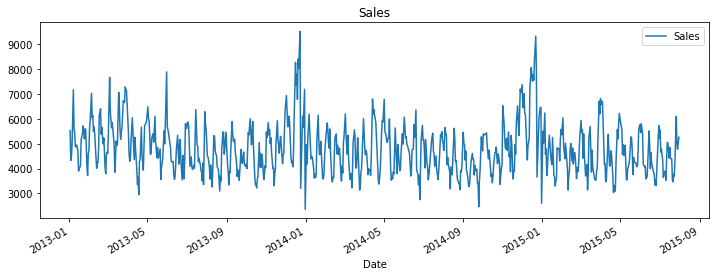

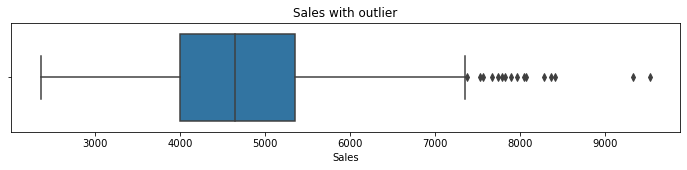

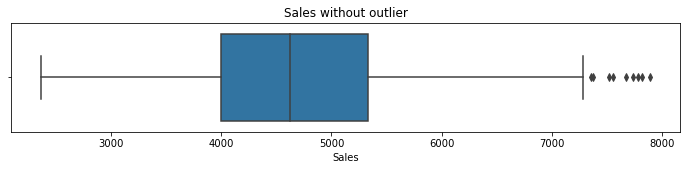

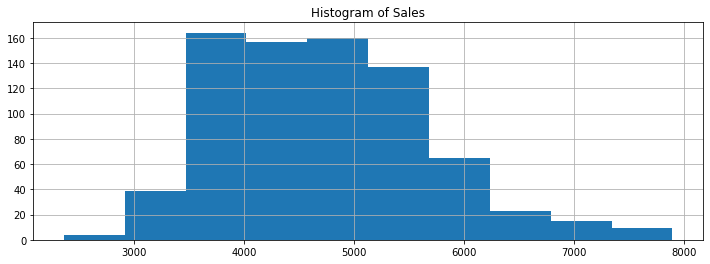

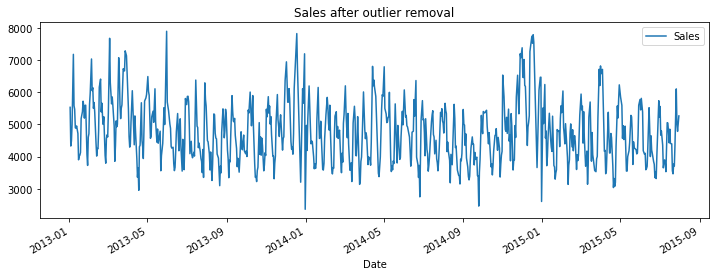

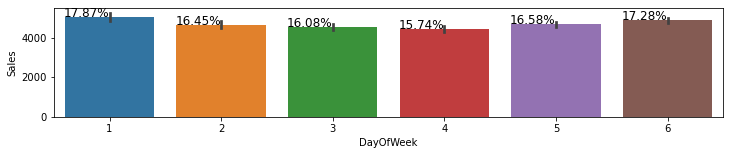

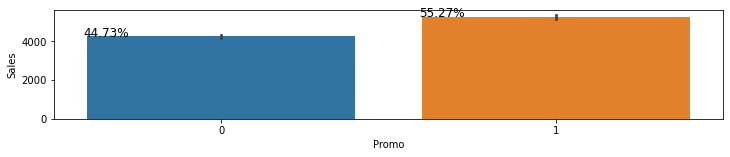

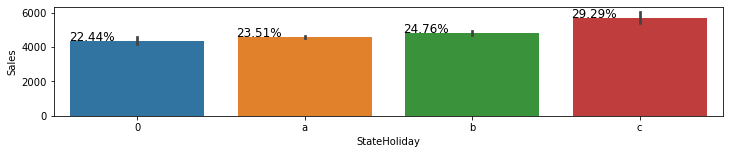

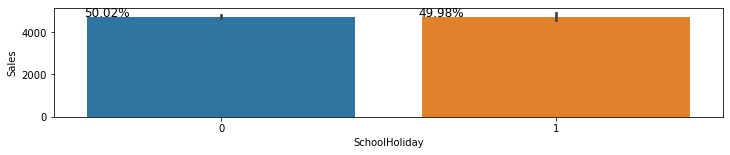

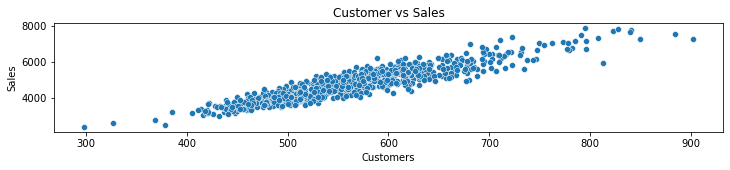

In [17]:
#Data selection
sfd1=sfd[(sfd['Store']==1)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

#### Seasonal decomposition¶

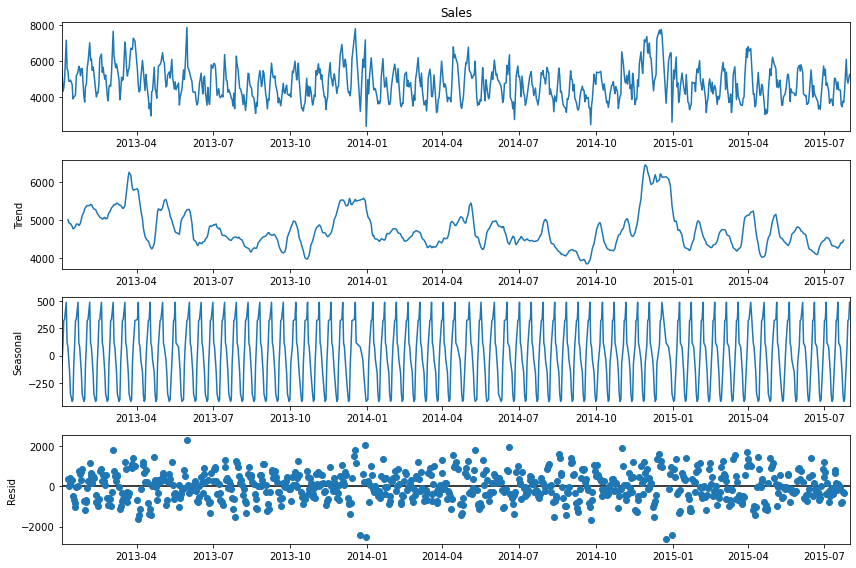

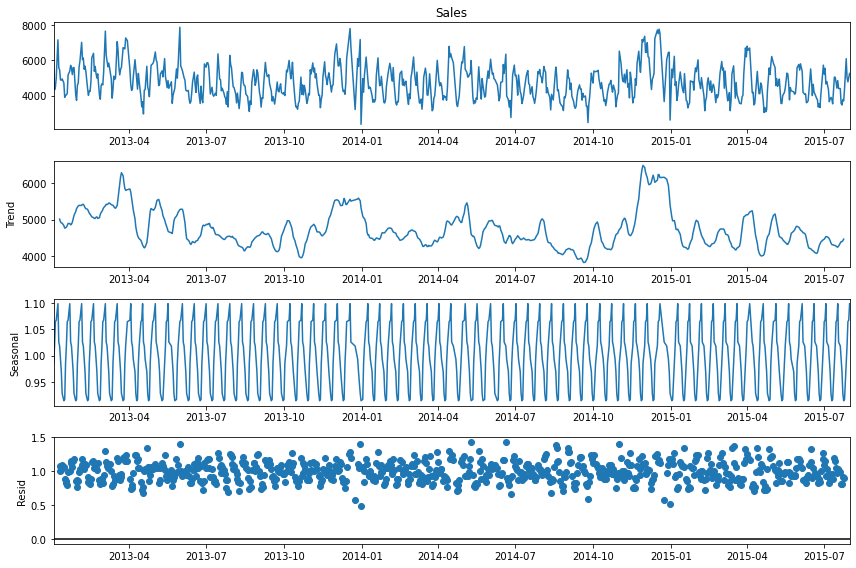

In [18]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

# Multiplicative seasonal decomposition

rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='multiplicative', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test



Sales: ADF test results:
ADF Statistic: -5.650163
p-value: 0.000001
Critical Values:
	5%: -2.865


Customers: ADF test results:
ADF Statistic: -4.245525
p-value: 0.000551
Critical Values:
	5%: -2.865


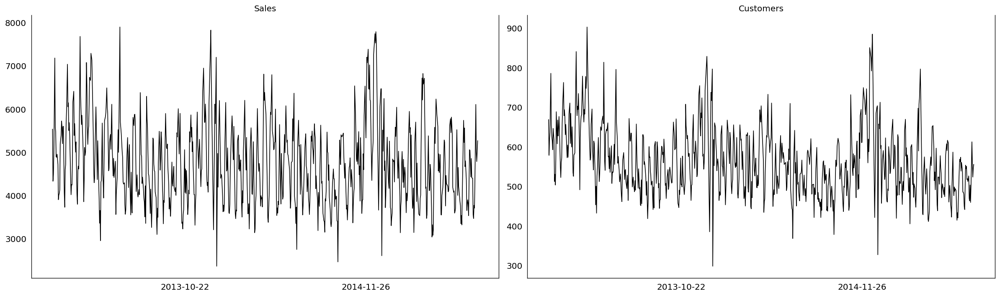

In [19]:
from statsmodels.tsa.stattools import adfuller 
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

By ADF test we can say that both the series are stationary

### Scaling 

In [20]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,773.000000,773.000000,773.000000
mean,0.433766,0.426396,0.448900
std,0.140172,0.170117,0.497704
min,0.000000,0.000000,0.000000
25%,0.332781,0.295787,0.000000
50%,0.415563,0.408968,0.000000
75%,0.514901,0.536250,1.000000
max,1.000000,1.000000,1.000000


#### Train test split 

In [21]:
model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-12']
test = model_data.loc['2015-06-13':]
print(train.shape)
print(test.shape)

(773, 4)
(731, 4)
(42, 4)


## VAR Model

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  731
Model:                             VAR(1)   Log Likelihood                1559.404
Date:                    Wed, 30 Nov 2022   AIC                          -3104.807
Time:                            18:51:21   BIC                          -3072.646
Sample:                                 0   HQIC                         -3092.400
                                    - 731                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            7.53, 26.45   Jarque-Bera (JB):        744.18, 38.52
Prob(Q):                        0.01, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.28, 0.96   Skew:                     -0.33, -0.13
Prob(H) (two-sided):            0.05, 0.76   Kurtosis:                   7.90, 4.10


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


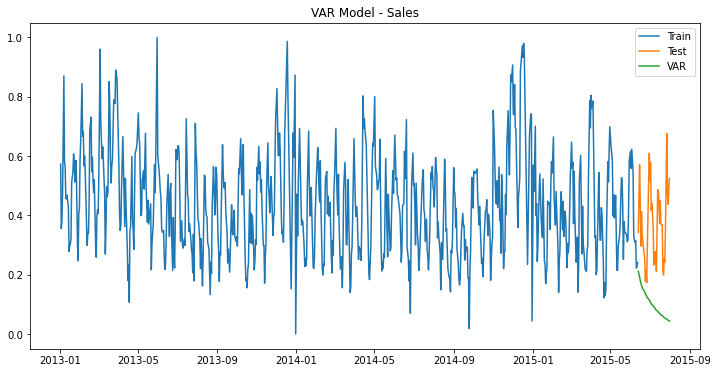

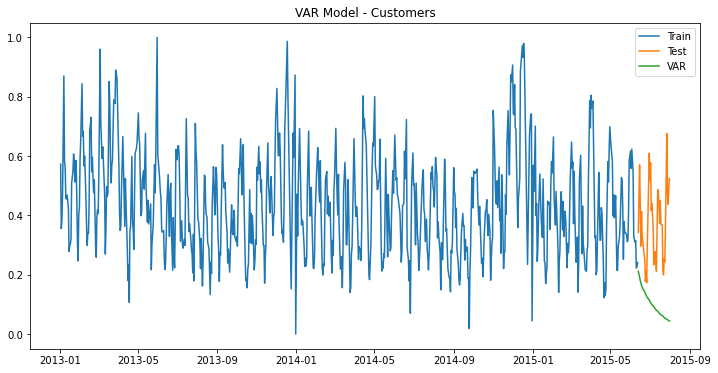

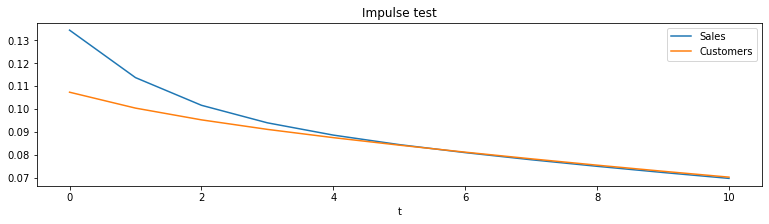

In [22]:
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

forcast=42
predict=res.get_prediction(start=len(train),end=len(train)+forcast-1)
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Sales')
plt.show()

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Customers')
plt.show()

#Impulse test

ax = res.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse test');
plt.show()

Predictions that we got is not matching with the test data so we can go for VARMAX model to imrove the model.

#### Calculating RMSE and MAPE 

In [23]:
from sklearn.metrics import mean_squared_error
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape
model_comparison.reset_index(drop=True, inplace=True)
print(model_comparison)

  Model   Variable  RMSE   MAPE
0   VAR      Sales  0.31  69.12
1   VAR  Customers  0.27  68.92


### VARMA MODEL 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  731
Model:                         VARMA(1,1)   Log Likelihood                1695.199
Date:                    Wed, 30 Nov 2022   AIC                          -3368.398
Time:                            18:51:37   BIC                          -3317.859
Sample:                                 0   HQIC                         -3348.901
                                    - 731                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.06, 4.22   Jarque-Bera (JB):       400.36, 122.97
Prob(Q):                        0.81, 0.04   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.15, 1.08   Skew:                      -0.15, 0.35
Prob(H) (two-sided):            0.27, 0.56   Kurtosis:                   6.61, 4.88


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


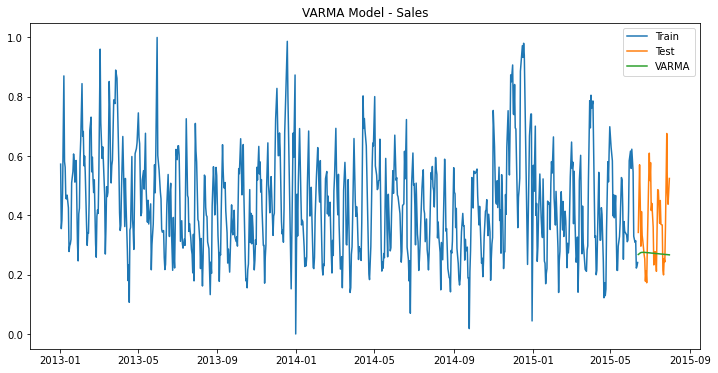

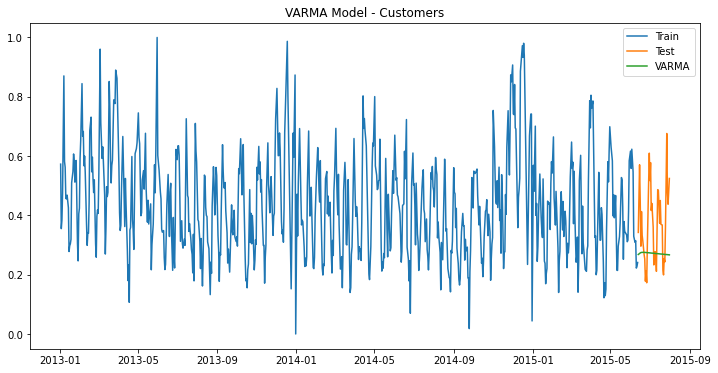

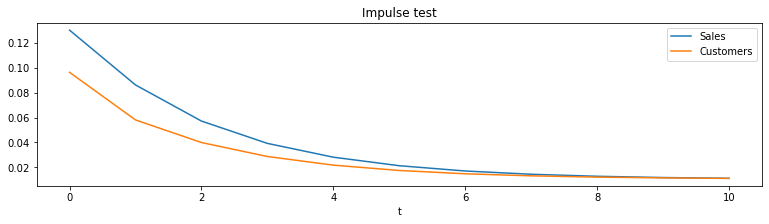

In [24]:
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

forcast=42
predict=res.get_prediction(start=len(train),end=len(train)+forcast-1)
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMA')
plt.legend(loc='best')
plt.title('VARMA Model - Sales')
plt.show()

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMA')
plt.legend(loc='best')
plt.title('VARMA Model - Customers')
plt.show()

#Impulse test

ax = res.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse test');
plt.show()

In [25]:
from sklearn.metrics import mean_squared_error
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison2=pd.DataFrame()
model_comparison2.loc[0,'Model']='VARMA'
model_comparison2.loc[0,'Variable']='Sales'
model_comparison2.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMA'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison2 = model_comparison2.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison2.loc[model_comparison2['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison2.loc[model_comparison2['Variable']=='Customers', 'MAPE'] = mape
model_comparison=pd.concat([model_comparison, model_comparison2], ignore_index = True)
print(model_comparison)

   Model   Variable  RMSE   MAPE
0    VAR      Sales  0.31  69.12
1    VAR  Customers  0.27  68.92
2  VARMA      Sales  0.16  30.65
3  VARMA  Customers  0.10  22.90


### johansen test

In [26]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  2
   max_eig_stat  trace_stat
0    230.888073  405.848887
1    173.227453  174.960815
2      1.733361    1.733361 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



#### VARMAX Model 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  731
Model:                        VARMAX(1,1)   Log Likelihood                1796.434
Date:                    Wed, 30 Nov 2022   AIC                          -3566.867
Time:                            18:52:01   BIC                          -3507.140
Sample:                                 0   HQIC                         -3543.825
                                    - 731                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            10.31, 1.01   Jarque-Bera (JB):        140.11, 91.90
Prob(Q):                        0.00, 0.32   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.45, 1.07   Skew:                       0.17, 0.14
Prob(H) (two-sided):            0.00, 0.58   Kurtosis:                   5.12, 4.71


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


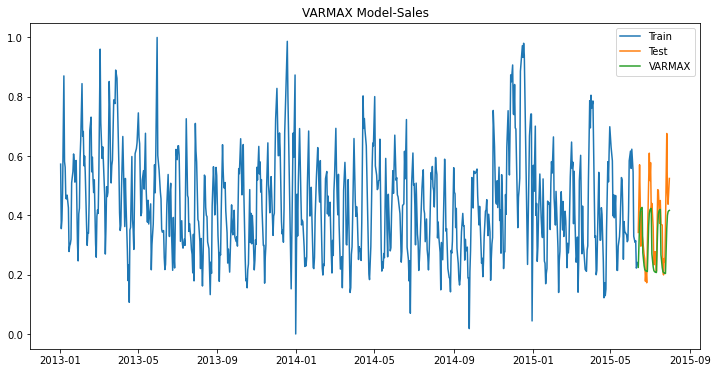

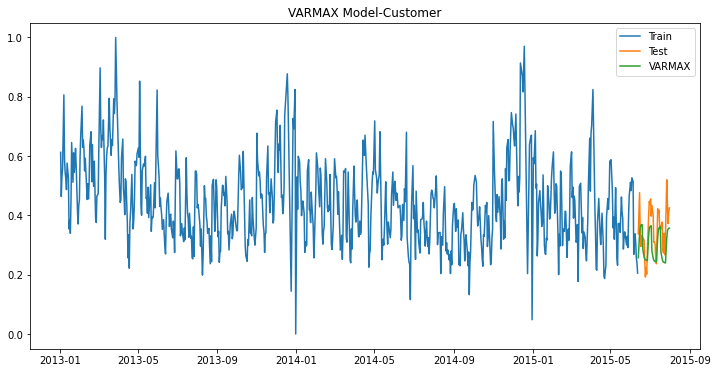

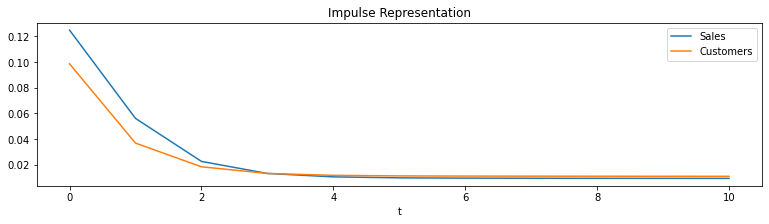

In [27]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()


### RMSE and MAPE 

In [28]:
from sklearn.metrics import mean_squared_error
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison1=pd.DataFrame()
model_comparison1.loc[0,'Model']='VARMAX'
model_comparison1.loc[0,'Variable']='Sales'
model_comparison1.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison1 = model_comparison1.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison1.loc[model_comparison1['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison1.loc[model_comparison1['Variable']=='Customers', 'MAPE'] = mape
display(pd.concat([model_comparison, model_comparison1], ignore_index = True))


,Model,Variable,RMSE,MAPE
0,VAR,Sales,0.31,69.12
1,VAR,Customers,0.27,68.92
2,VARMA,Sales,0.16,30.65
3,VARMA,Customers,0.10,22.90
4,VARMAX,Sales,0.10,20.17
5,VARMAX,Customers,0.08,17.38


By comparing the RMSE and MAPE value for the above three model, we can conclude that VARMAX is giving better prediction when compare to VAR and VARMA because RMSE and MAPE is less compare to other model. Less RMSE and MAPE value will be better model.

So, for the other store we will predict using the VARMAX model.

## Store 3

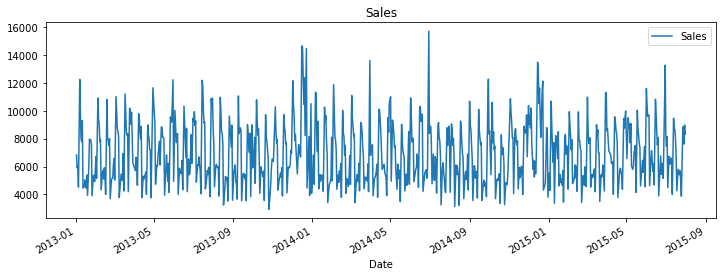

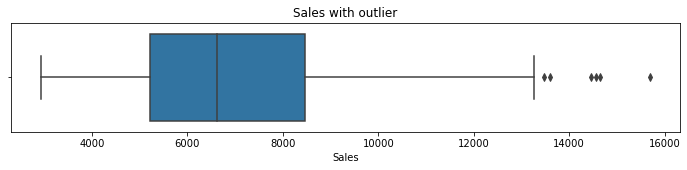

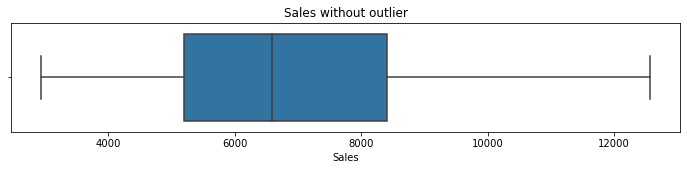

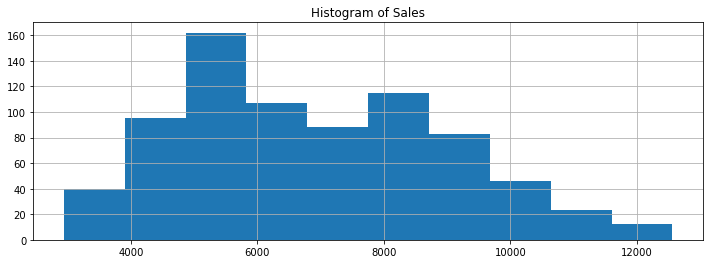

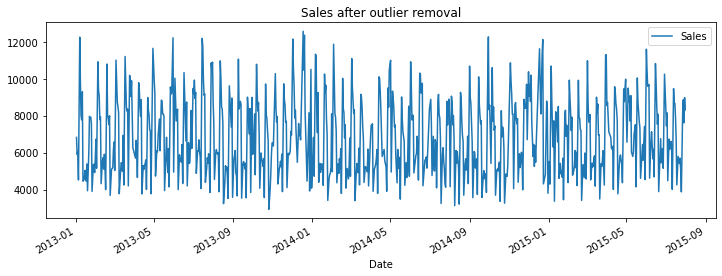

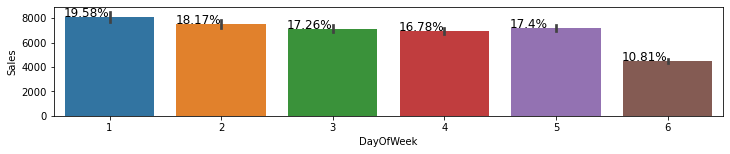

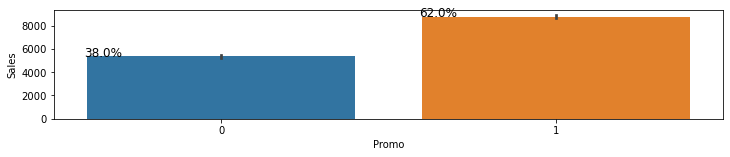

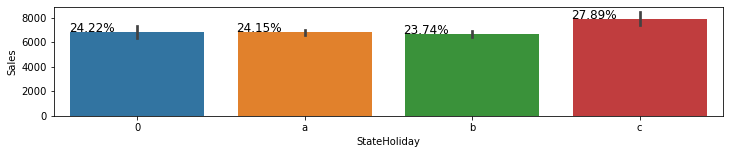

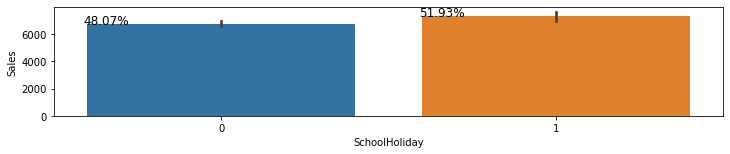

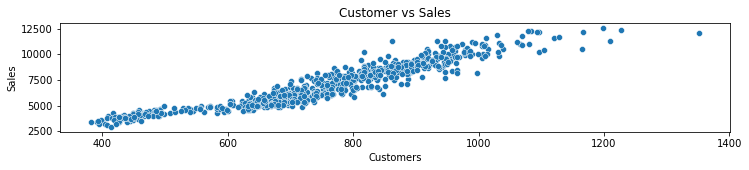

In [29]:
#Data selection
sfd1=sfd[(sfd['Store']==3)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

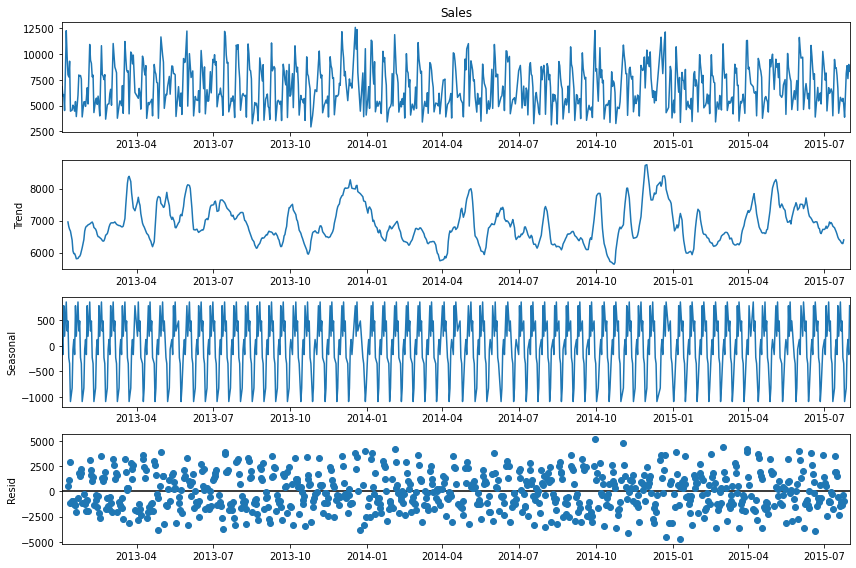

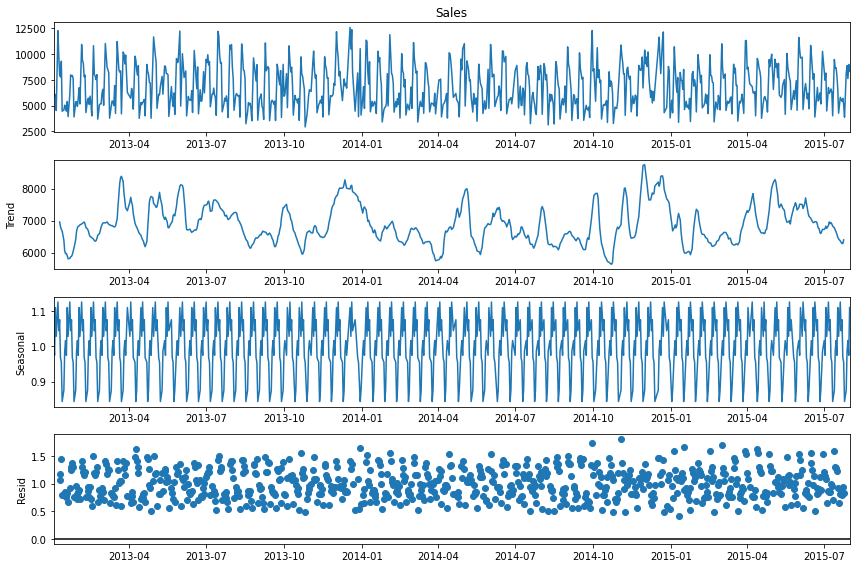

In [30]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

# Multiplicative seasonal decomposition

rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='multiplicative', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()



Sales: ADF test results:
ADF Statistic: -6.518124
p-value: 0.000000
Critical Values:
	5%: -2.865


Customers: ADF test results:
ADF Statistic: -5.890508
p-value: 0.000000
Critical Values:
	5%: -2.865


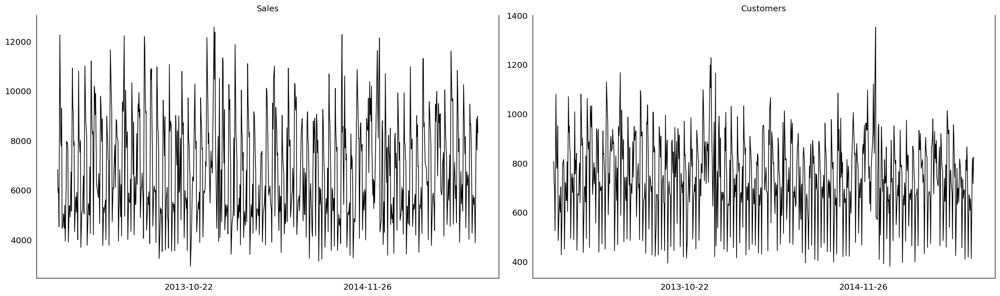

In [31]:
#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

By ADF test we can say that both the series are stationary

In [32]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,771.000000,771.000000,771.000000
mean,0.374905,0.408431,0.444877
std,0.167941,0.215800,0.497275
min,0.000000,0.000000,0.000000
25%,0.286818,0.235251,0.000000
50%,0.372812,0.380037,0.000000
75%,0.491246,0.568187,1.000000
max,1.000000,1.000000,1.000000


In [33]:
model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-11']
test = model_data.loc['2015-06-12':]
print(train.shape)
print(test.shape)

(771, 4)
(729, 4)
(42, 4)


In [34]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  2
   max_eig_stat  trace_stat
0    290.742925  534.213725
1    239.862587  243.470799
2      3.608212    3.608212 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



### VARMAX MODEL 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  729
Model:                        VARMAX(1,1)   Log Likelihood                1657.185
Date:                    Wed, 30 Nov 2022   AIC                          -3288.371
Time:                            18:52:34   BIC                          -3228.679
Sample:                                 0   HQIC                         -3265.340
                                    - 729                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):           29.35, 28.49   Jarque-Bera (JB):        129.59, 16.94
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.10, 1.09   Skew:                      0.08, -0.36
Prob(H) (two-sided):            0.48, 0.48   Kurtosis:                   5.06, 3.17


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


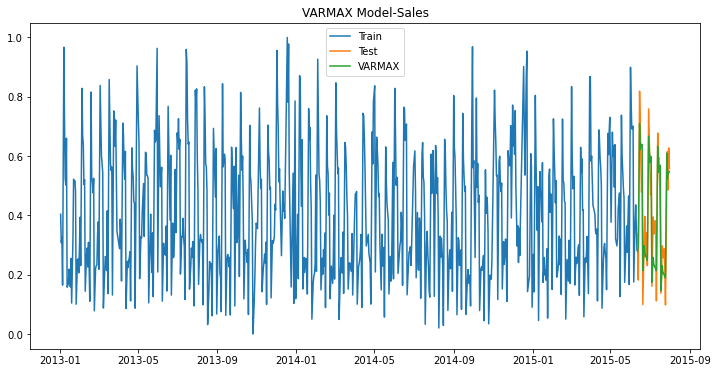

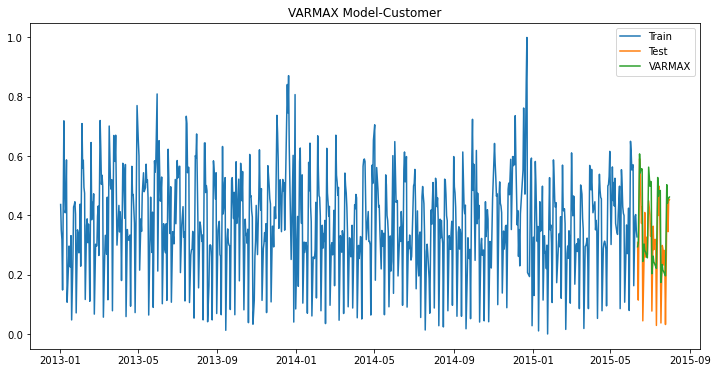

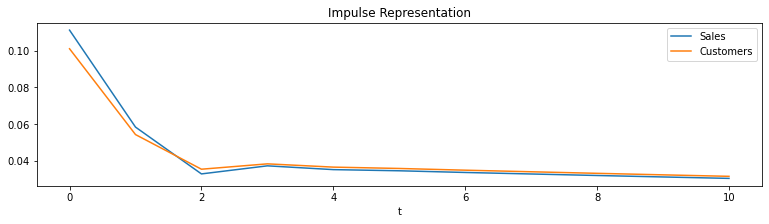

In [35]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()


In [36]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape
model_comparison.reset_index(drop=True, inplace=True)
print(model_comparison)

    Model   Variable  RMSE   MAPE
0  VARMAX      Sales  0.09  24.81
1  VARMAX  Customers  0.10  73.06


## Store 8

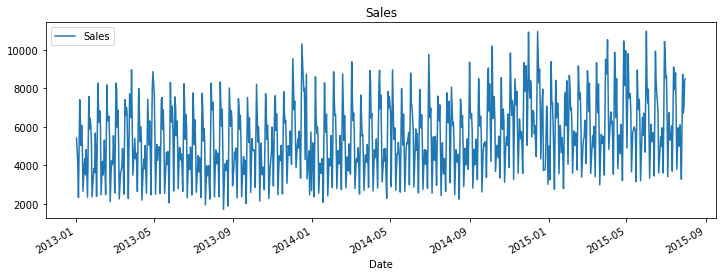

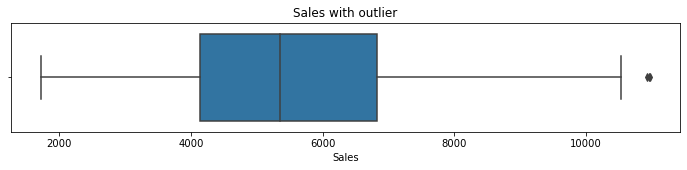

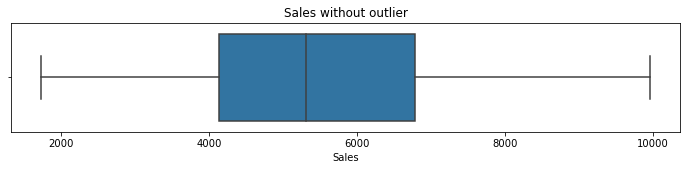

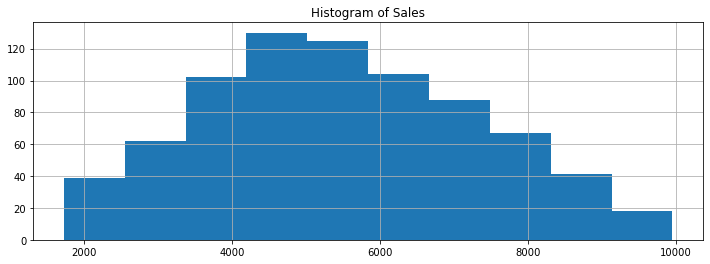

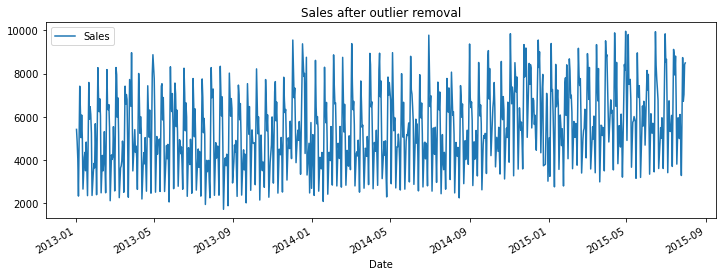

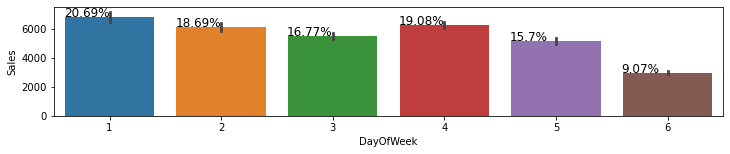

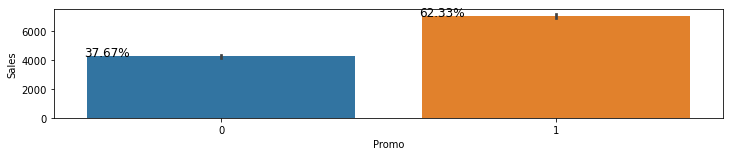

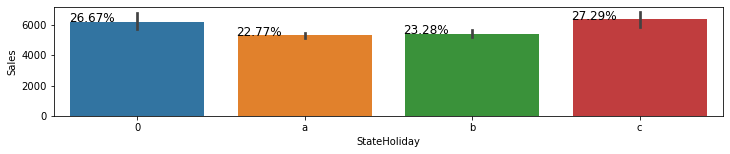

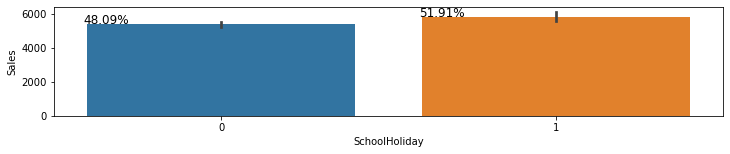

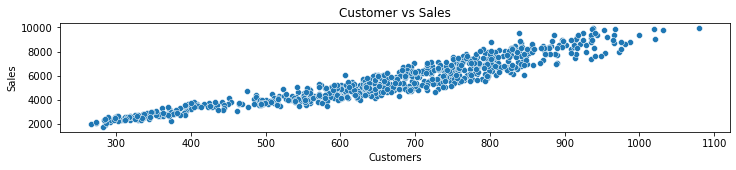

In [37]:
#Data selection
sfd1=sfd[(sfd['Store']==8)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

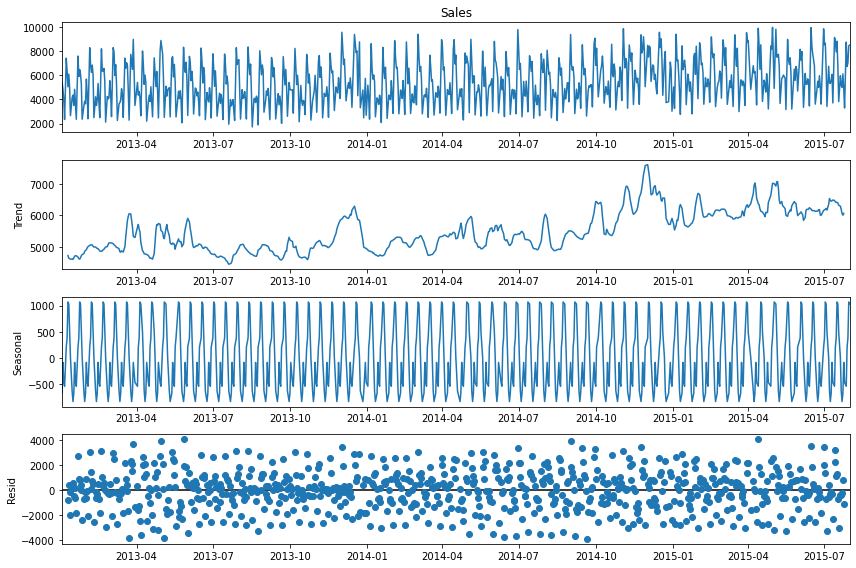

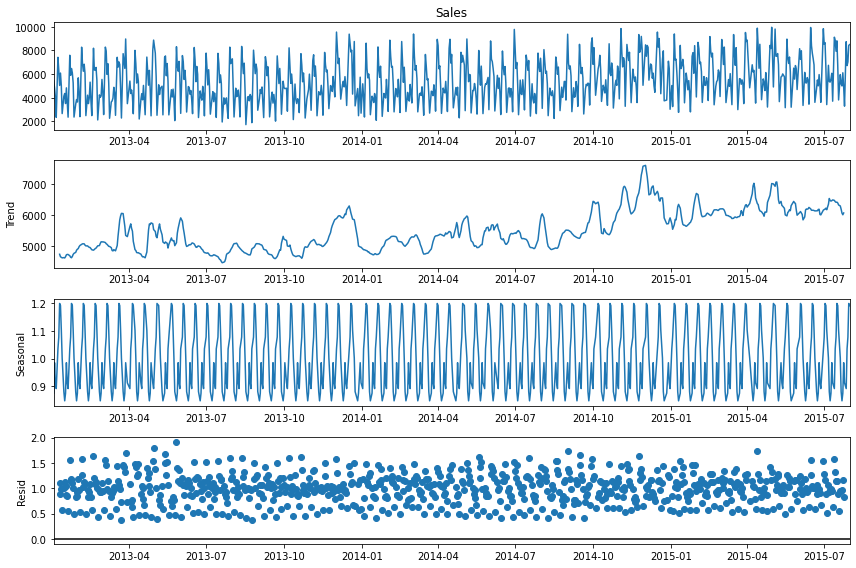

In [38]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

# Multiplicative seasonal decomposition

rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='multiplicative', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()



Sales: ADF test results:
ADF Statistic: -3.068142
p-value: 0.029002
Critical Values:
	5%: -2.865


Customers: ADF test results:
ADF Statistic: -3.378611
p-value: 0.011710
Critical Values:
	5%: -2.865


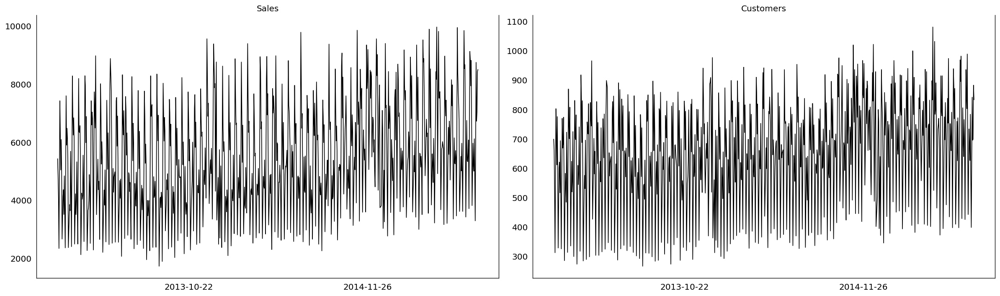

In [39]:
#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

By ADF test we can say that both the series are stationary

In [40]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,776.000000,776.000000,776.000000
mean,0.477203,0.457073,0.444588
std,0.211392,0.222582,0.497240
min,0.000000,0.000000,0.000000
25%,0.357187,0.291611,0.000000
50%,0.493857,0.435245,0.000000
75%,0.632678,0.614142,1.000000
max,1.000000,1.000000,1.000000


In [41]:
model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-11']
test = model_data.loc['2015-06-12':]
print(train.shape)
print(test.shape)

(776, 4)
(734, 4)
(42, 4)


In [42]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  3
   max_eig_stat  trace_stat
0    255.230715  495.127675
1    233.242627  239.896960
2      6.654332    6.654332 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



### VARMAX MODEL 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  734
Model:                        VARMAX(1,1)   Log Likelihood                1329.176
Date:                    Wed, 30 Nov 2022   AIC                          -2632.351
Time:                            18:52:49   BIC                          -2572.570
Sample:                                 0   HQIC                         -2609.293
                                    - 734                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):          100.66, 12.84   Jarque-Bera (JB):           2.13, 1.34
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.34, 0.51
Heteroskedasticity (H):         1.14, 1.20   Skew:                       0.10, 0.01
Prob(H) (two-sided):            0.31, 0.15   Kurtosis:                   2.83, 2.79


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


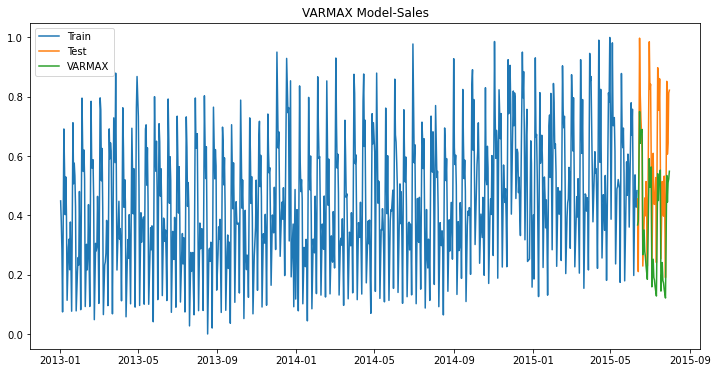

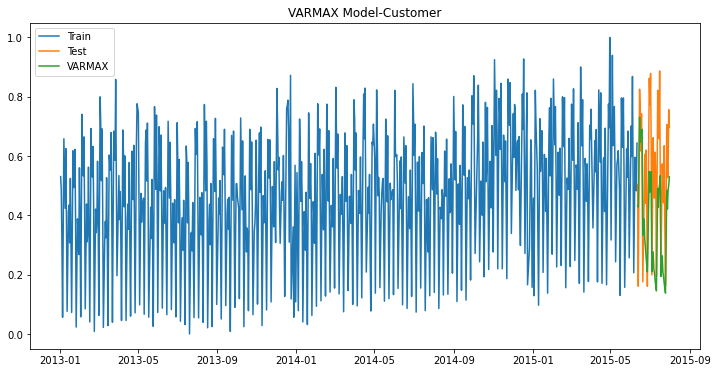

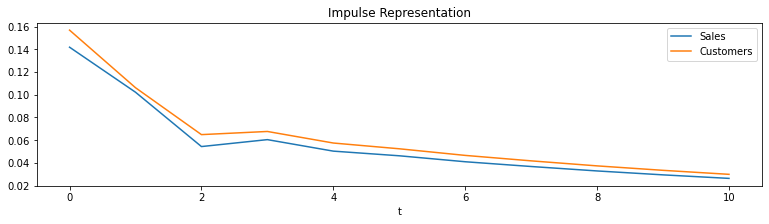

In [43]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()


In [44]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape
model_comparison.reset_index(drop=True, inplace=True)
print(model_comparison)

    Model   Variable  RMSE   MAPE
0  VARMAX      Sales  0.24  37.83
1  VARMAX  Customers  0.24  38.96


## Store 9

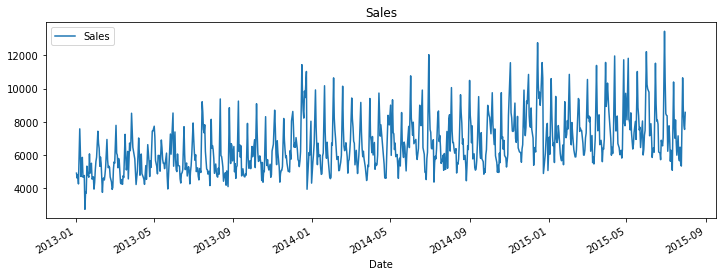

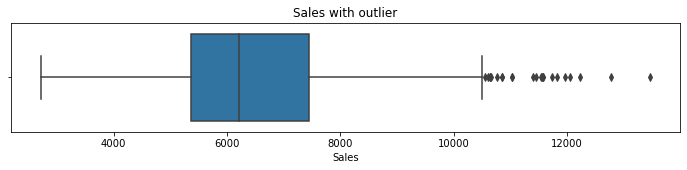

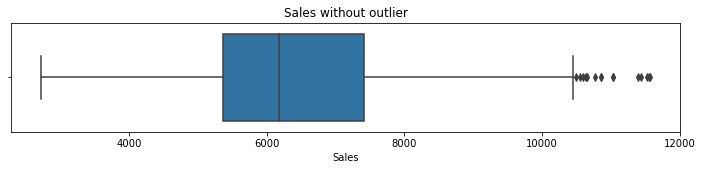

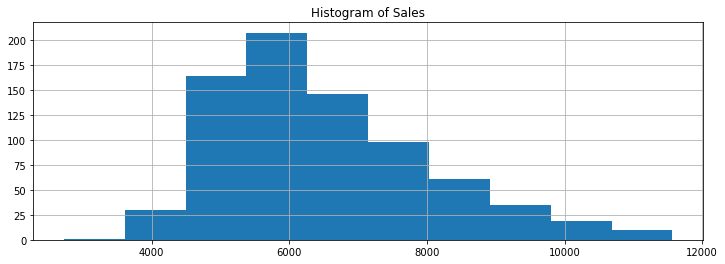

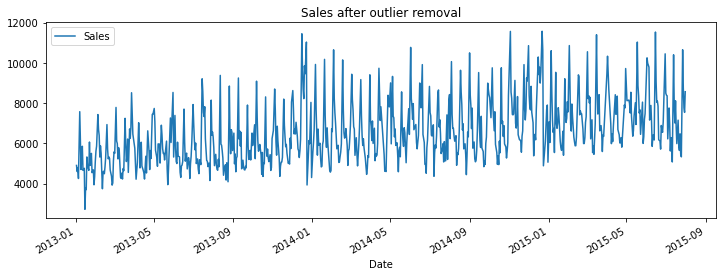

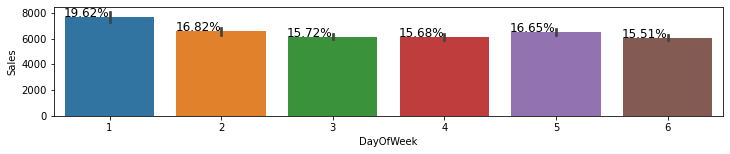

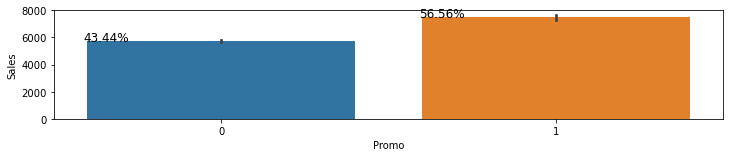

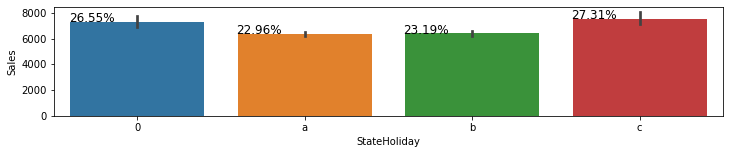

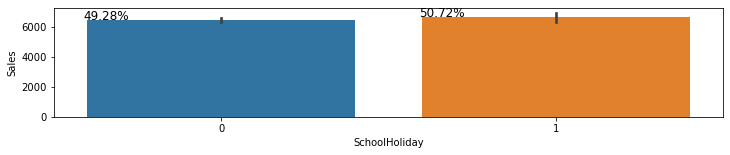

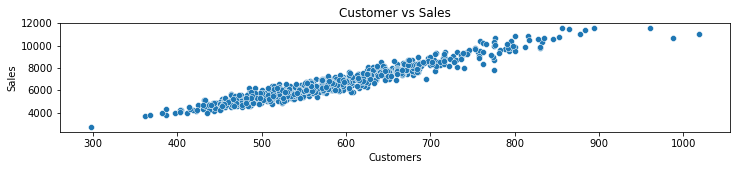

In [45]:
#Data selection
sfd1=sfd[(sfd['Store']==9)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

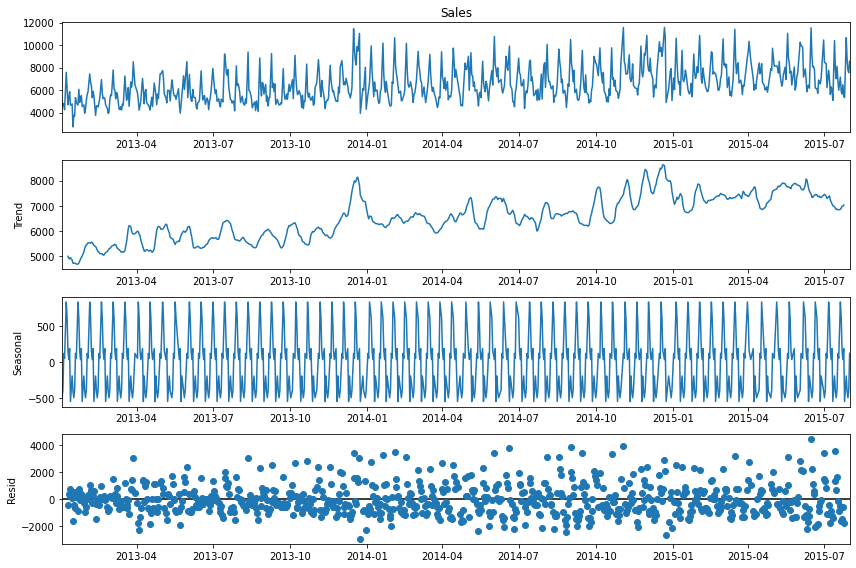

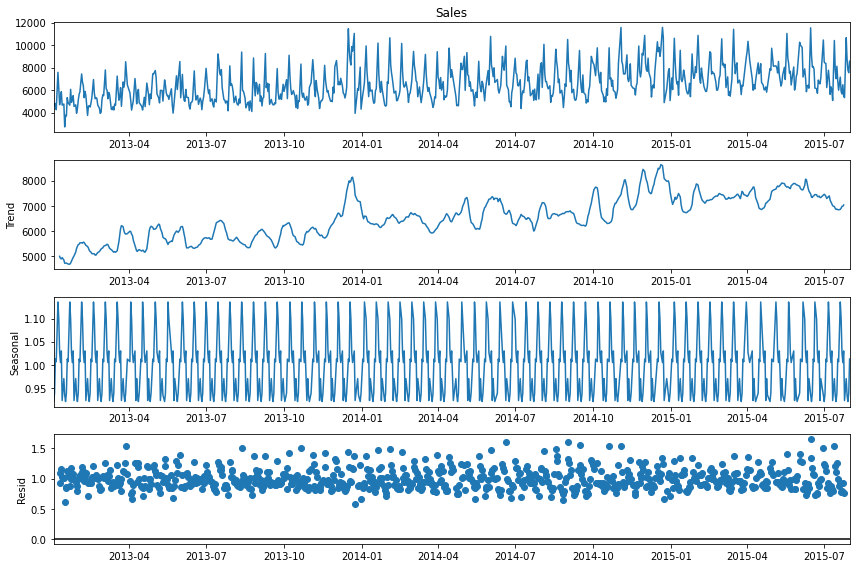

In [46]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

# Multiplicative seasonal decomposition

rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='multiplicative', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()



Sales: ADF test results:
ADF Statistic: -3.076678
p-value: 0.028328
Critical Values:
	5%: -2.865


Customers: ADF test results:
ADF Statistic: -3.441914
p-value: 0.009610
Critical Values:
	5%: -2.865


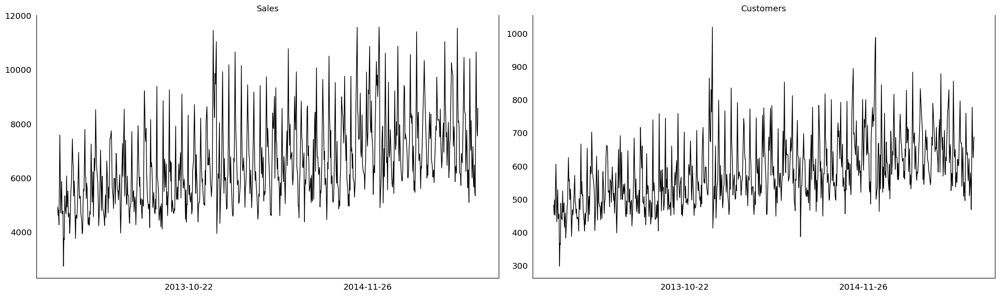

In [47]:
#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

By ADF test we can say that both the series are stationary

In [48]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,771.000000,771.000000,771.000000
mean,0.387601,0.427341,0.443580
std,0.137679,0.173049,0.497129
min,0.000000,0.000000,0.000000
25%,0.286704,0.298756,0.000000
50%,0.364266,0.391521,0.000000
75%,0.466759,0.530413,1.000000
max,1.000000,1.000000,1.000000


In [54]:
model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-11']
test = model_data.loc['2015-06-12':]
print(train.shape)
print(test.shape)

(771, 4)
(729, 4)
(42, 4)


In [55]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  2
   max_eig_stat  trace_stat
0    237.868791  427.299514
1    188.239318  189.430723
2      1.191405    1.191405 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



### VARMAX MODEL 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  729
Model:                        VARMAX(1,1)   Log Likelihood                1903.604
Date:                    Wed, 30 Nov 2022   AIC                          -3781.207
Time:                            18:55:22   BIC                          -3721.516
Sample:                                 0   HQIC                         -3758.176
                                    - 729                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.08, 0.51   Jarque-Bera (JB):        38.22, 220.78
Prob(Q):                        0.77, 0.48   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.61, 1.67   Skew:                       0.28, 0.37
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                   3.97, 5.59


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


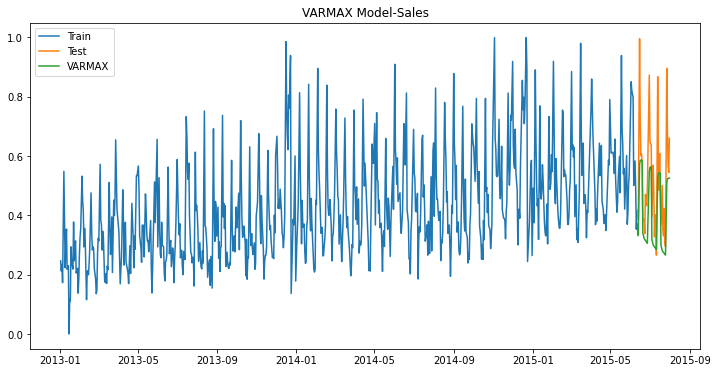

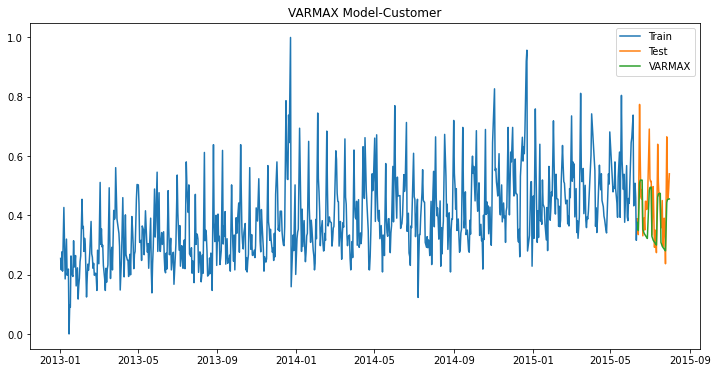

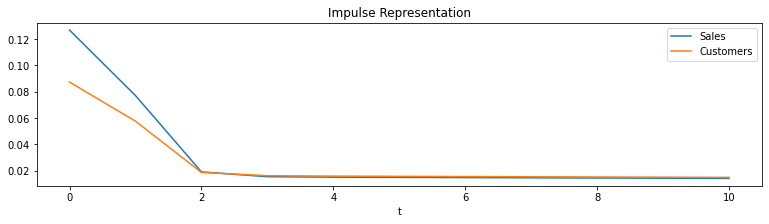

In [56]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()

In [57]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape
model_comparison.reset_index(drop=True, inplace=True)
print(model_comparison)

    Model   Variable  RMSE   MAPE
0  VARMAX      Sales  0.15  20.22
1  VARMAX  Customers  0.09  14.12


## Store 13

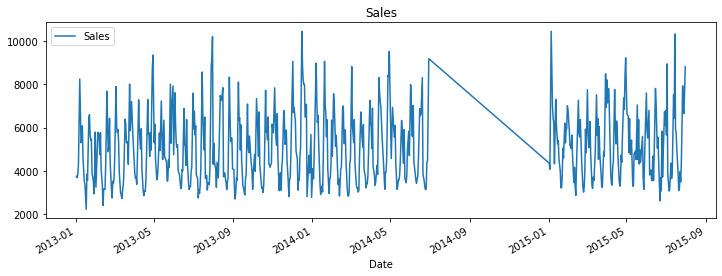

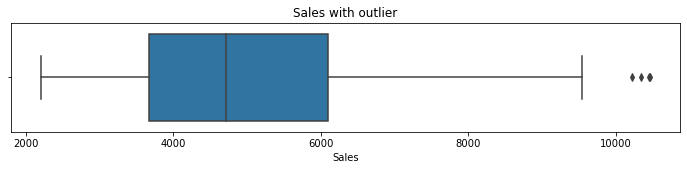

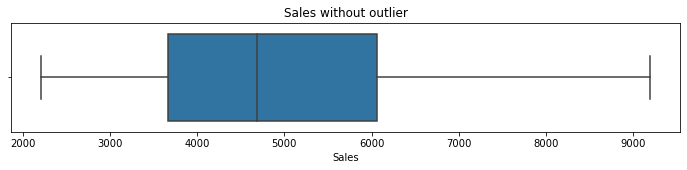

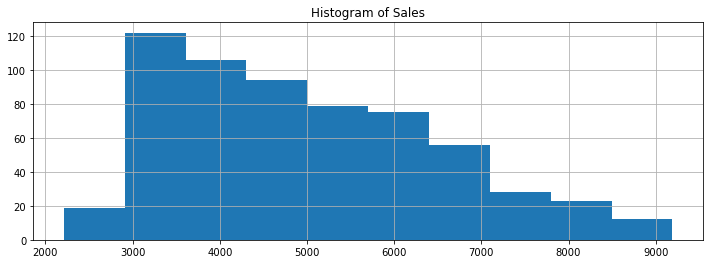

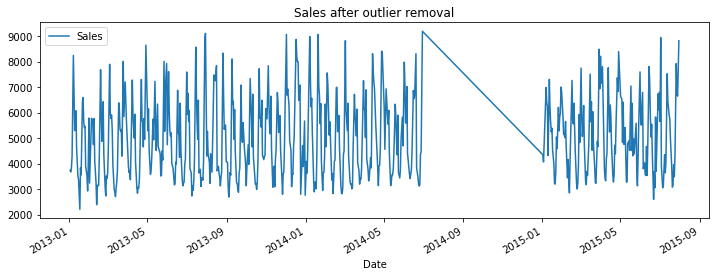

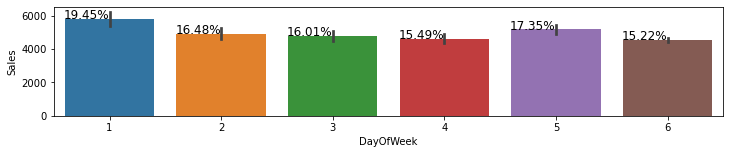

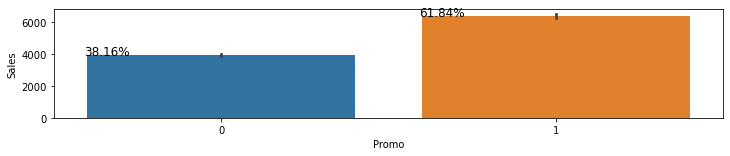

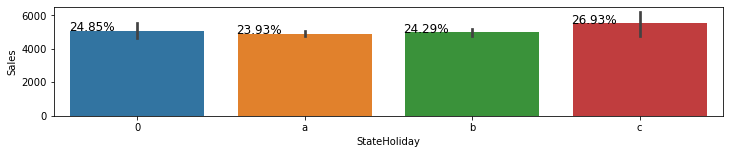

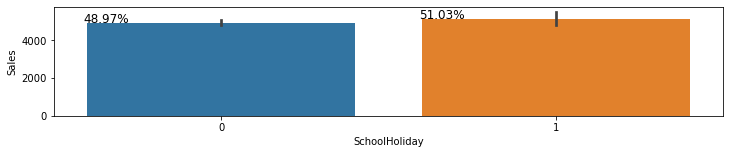

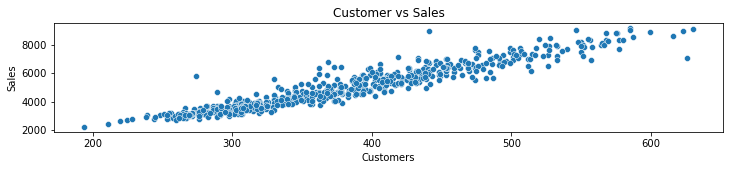

In [58]:
#Data selection
sfd1=sfd[(sfd['Store']==13)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

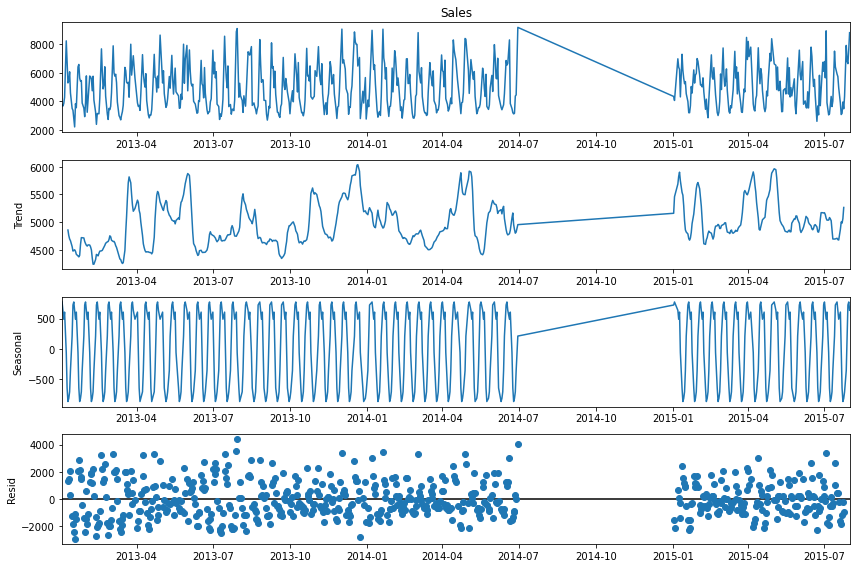

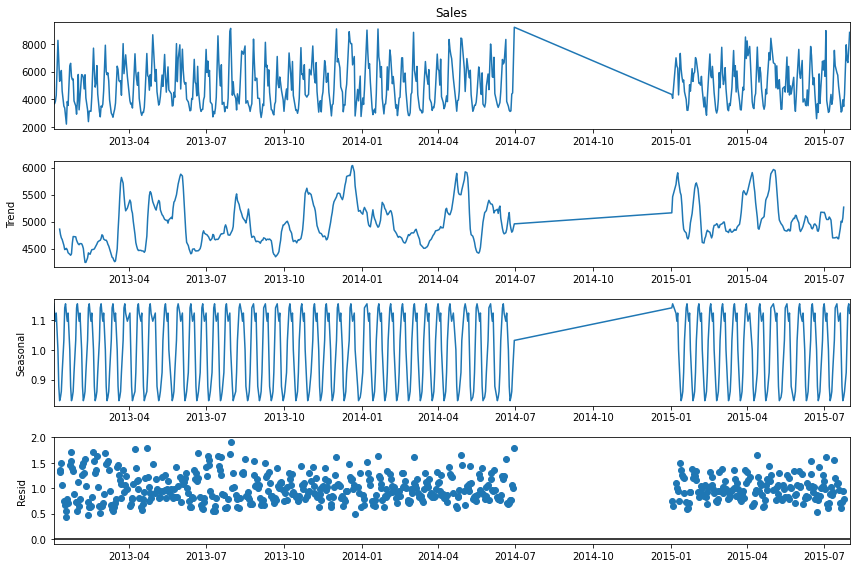

In [59]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

# Multiplicative seasonal decomposition

rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='multiplicative', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()



Sales: ADF test results:
ADF Statistic: -6.207937
p-value: 0.000000
Critical Values:
	5%: -2.866


Customers: ADF test results:
ADF Statistic: -5.234161
p-value: 0.000007
Critical Values:
	5%: -2.866


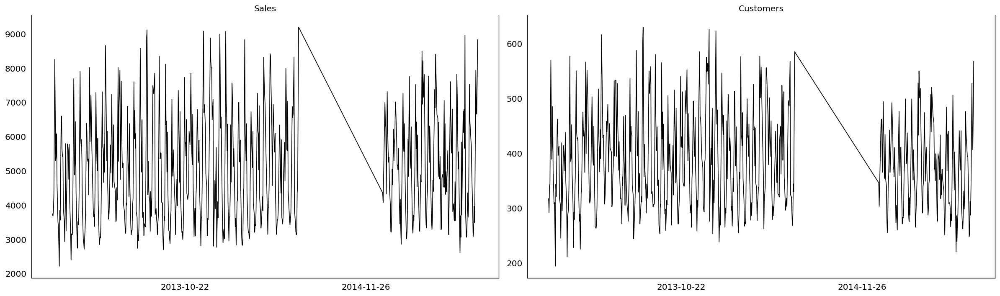

In [60]:
#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

By ADF test we can say that both the series are stationary

In [61]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,614.000000,614.000000,614.000000
mean,0.426960,0.396566,0.434853
std,0.193759,0.220279,0.496142
min,0.000000,0.000000,0.000000
25%,0.266055,0.208393,0.000000
50%,0.401376,0.354841,0.000000
75%,0.556193,0.552421,1.000000
max,1.000000,1.000000,1.000000


In [63]:
model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-11']
test = model_data.loc['2015-06-12':]
print(train.shape)
print(test.shape)

(614, 4)
(572, 4)
(42, 4)


In [64]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  2
   max_eig_stat  trace_stat
0    205.348841  357.223494
1    149.446609  151.874653
2      2.428044    2.428044 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



### VARMAX MODEL 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  572
Model:                        VARMAX(1,1)   Log Likelihood                1212.606
Date:                    Wed, 30 Nov 2022   AIC                          -2399.211
Time:                            18:56:47   BIC                          -2342.672
Sample:                                 0   HQIC                         -2377.155
                                    - 572                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.00, 8.51   Jarque-Bera (JB):         25.28, 99.99
Prob(Q):                        0.95, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.43, 1.60   Skew:                      0.22, -0.17
Prob(H) (two-sided):            0.01, 0.00   Kurtosis:                   3.93, 5.02


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


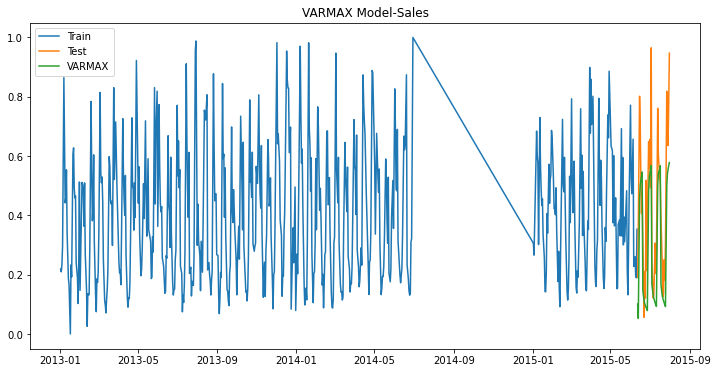

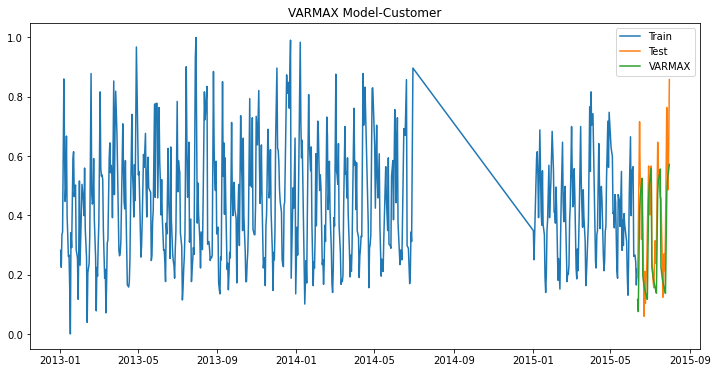

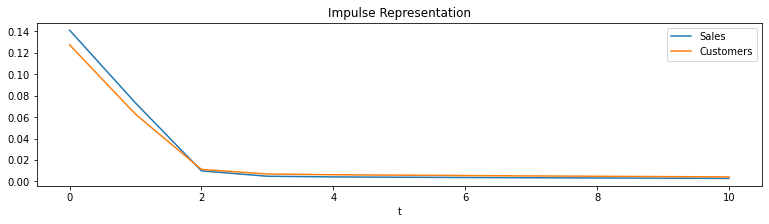

In [65]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()

In [66]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape
model_comparison.reset_index(drop=True, inplace=True)
print(model_comparison)

    Model   Variable  RMSE   MAPE
0  VARMAX      Sales  0.18  37.42
1  VARMAX  Customers  0.13  32.80


## Store 25

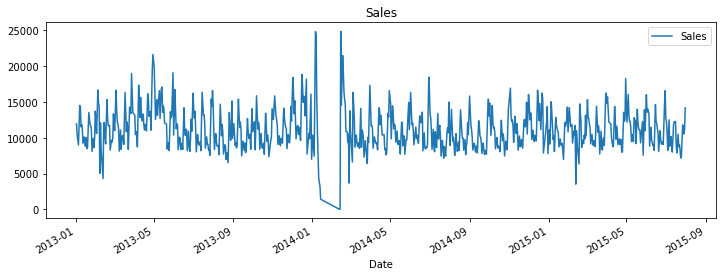

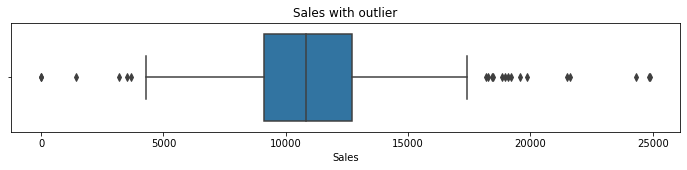

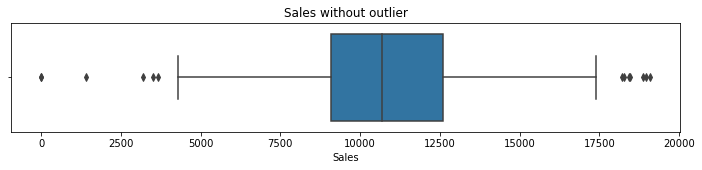

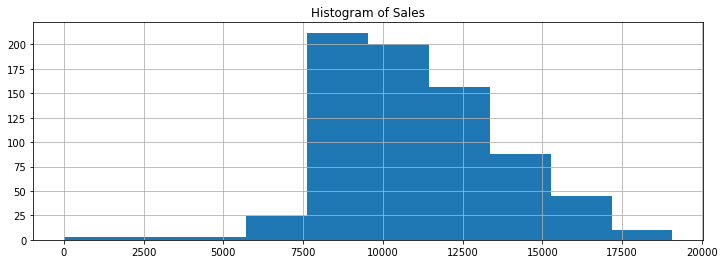

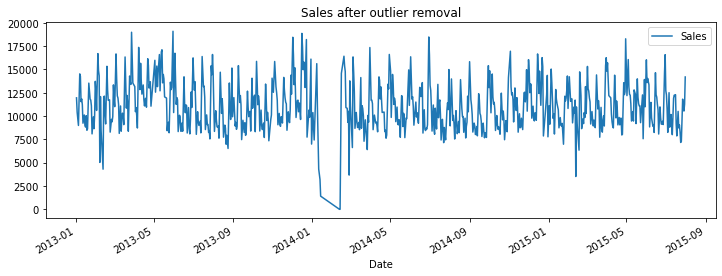

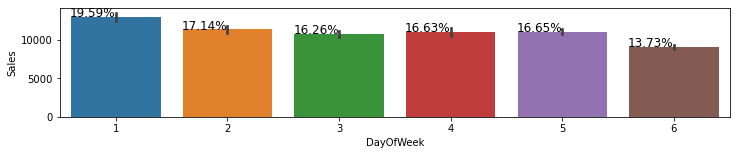

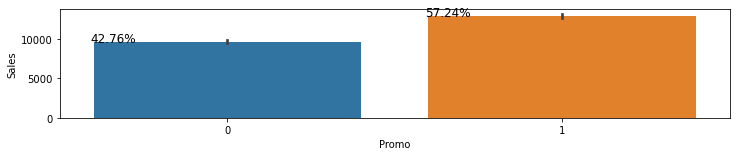

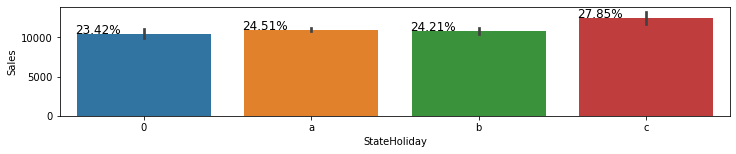

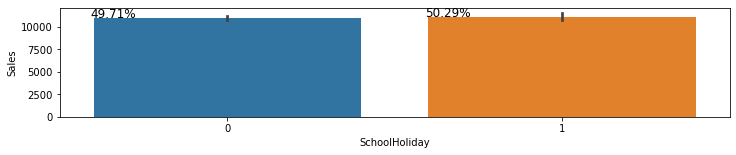

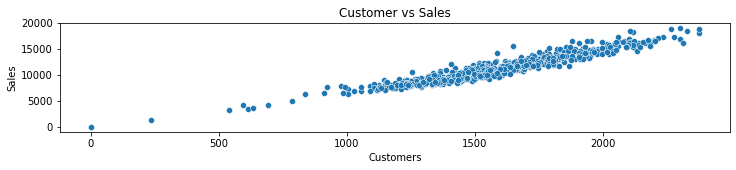

In [67]:
#Data selection
sfd1=sfd[(sfd['Store']==25)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

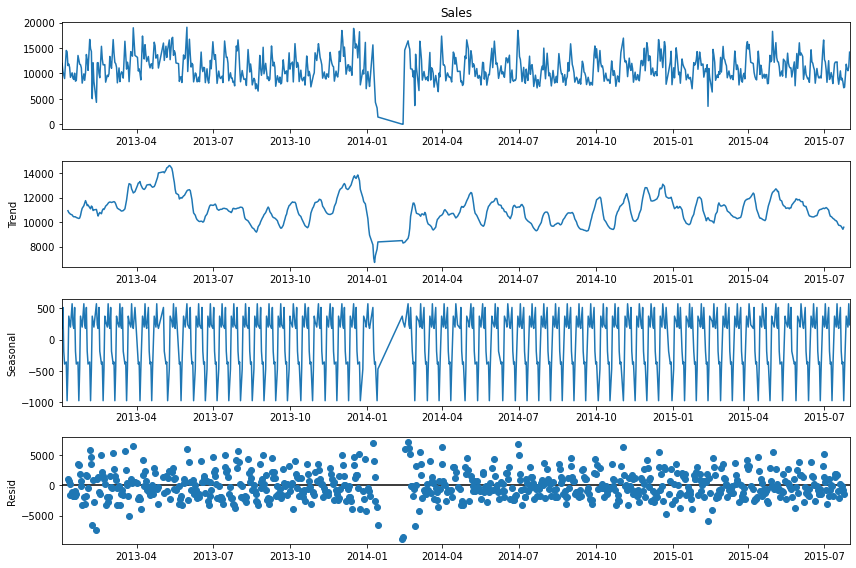

In [69]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()



Sales: ADF test results:
ADF Statistic: -6.385718
p-value: 0.000000
Critical Values:
	5%: -2.866


Customers: ADF test results:
ADF Statistic: -5.239828
p-value: 0.000007
Critical Values:
	5%: -2.866


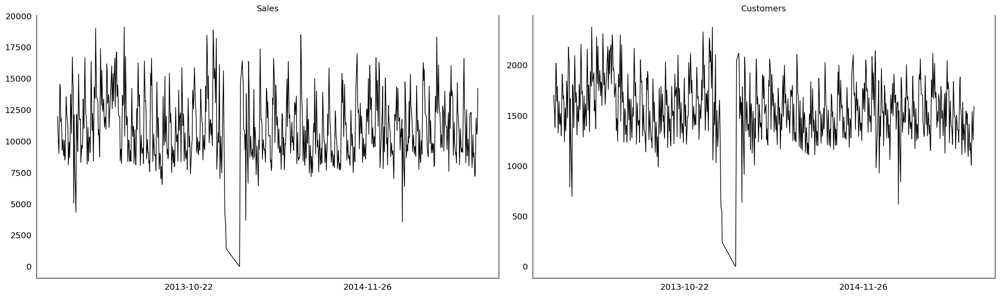

In [70]:
#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

By ADF test we can say that both the series are stationary

In [71]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,744.000000,744.000000,744.000000
mean,0.655396,0.577700,0.444892
std,0.124695,0.138175,0.497288
min,0.000000,0.000000,0.000000
25%,0.572706,0.476743,0.000000
50%,0.648359,0.560666,0.000000
75%,0.732849,0.660115,1.000000
max,1.000000,1.000000,1.000000


In [72]:
model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-12']
test = model_data.loc['2015-06-13':]
print(train.shape)
print(test.shape)

(744, 4)
(702, 4)
(42, 4)


In [73]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  2
   max_eig_stat  trace_stat
0    209.838394  358.342249
1    146.067115  148.503855
2      2.436740    2.436740 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



### VARMAX MODEL 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  702
Model:                        VARMAX(1,1)   Log Likelihood                2089.049
Date:                    Wed, 30 Nov 2022   AIC                          -4152.099
Time:                            18:58:08   BIC                          -4092.898
Sample:                                 0   HQIC                         -4129.217
                                    - 702                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            3.01, 13.47   Jarque-Bera (JB):       427.30, 121.07
Prob(Q):                        0.08, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.90, 1.16   Skew:                      0.55, -0.47
Prob(H) (two-sided):            0.44, 0.24   Kurtosis:                   6.66, 4.80


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


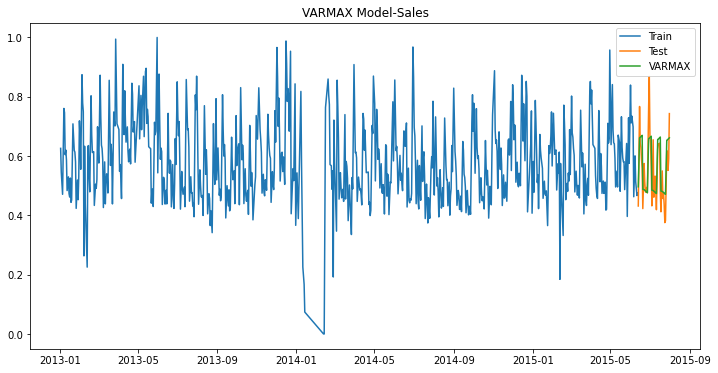

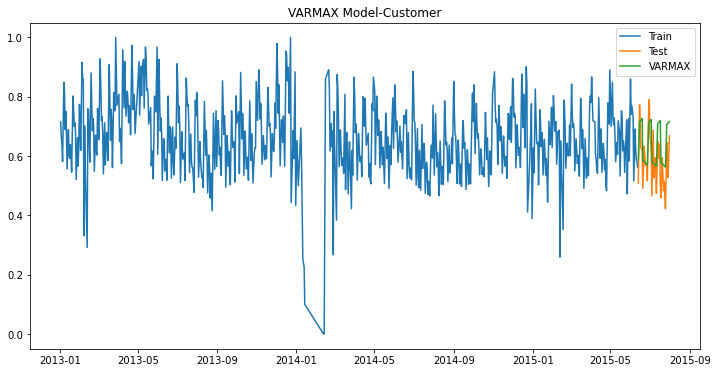

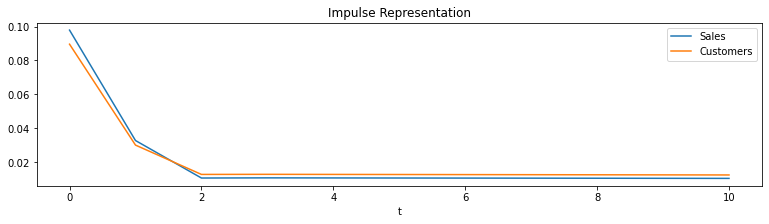

In [74]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()


In [75]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape
model_comparison.reset_index(drop=True, inplace=True)
print(model_comparison)

    Model   Variable  RMSE  MAPE
0  VARMAX      Sales  0.08  10.7
1  VARMAX  Customers  0.09  13.1


## Store 29

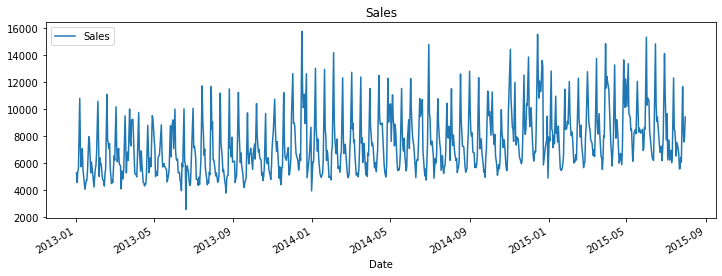

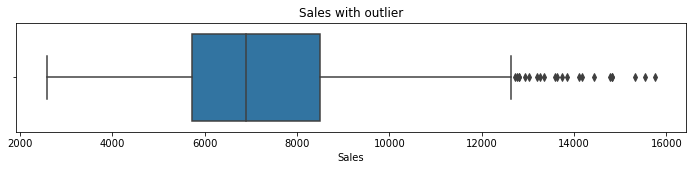

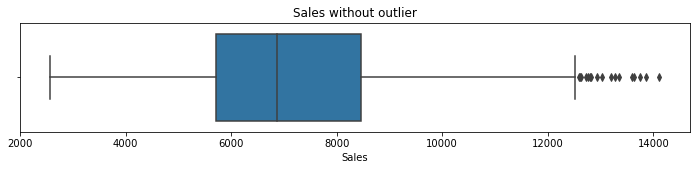

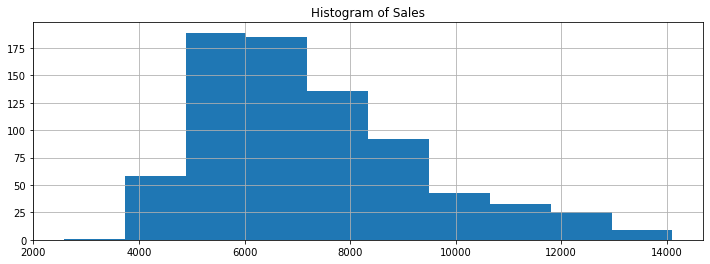

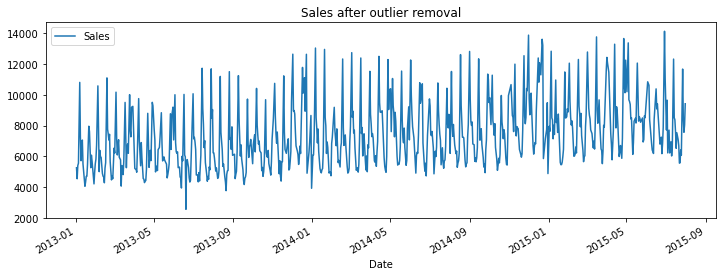

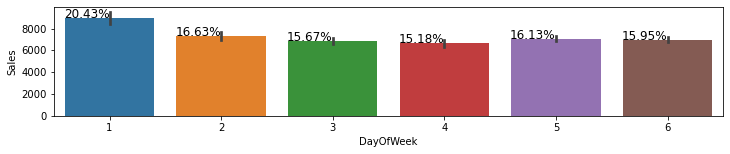

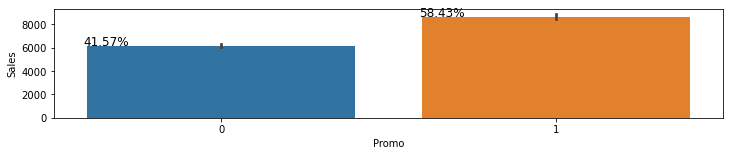

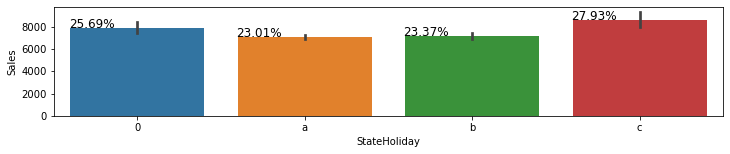

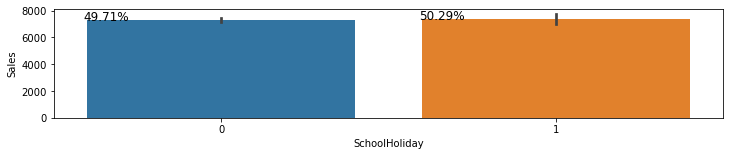

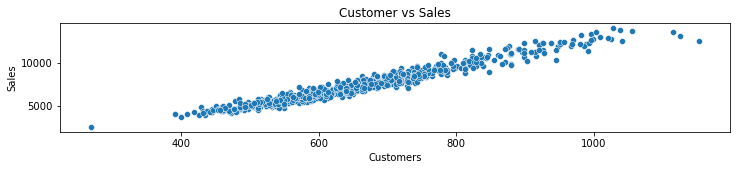

In [76]:
#Data selection
sfd1=sfd[(sfd['Store']==29)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

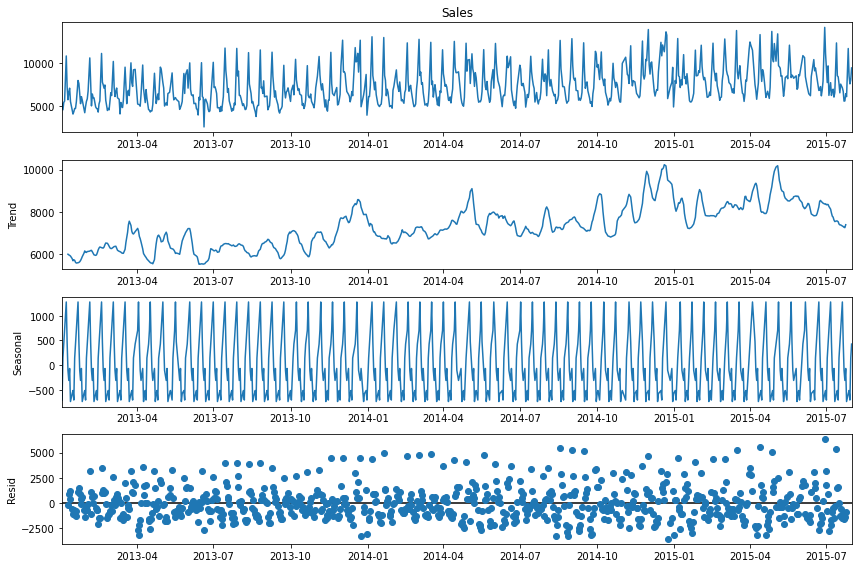

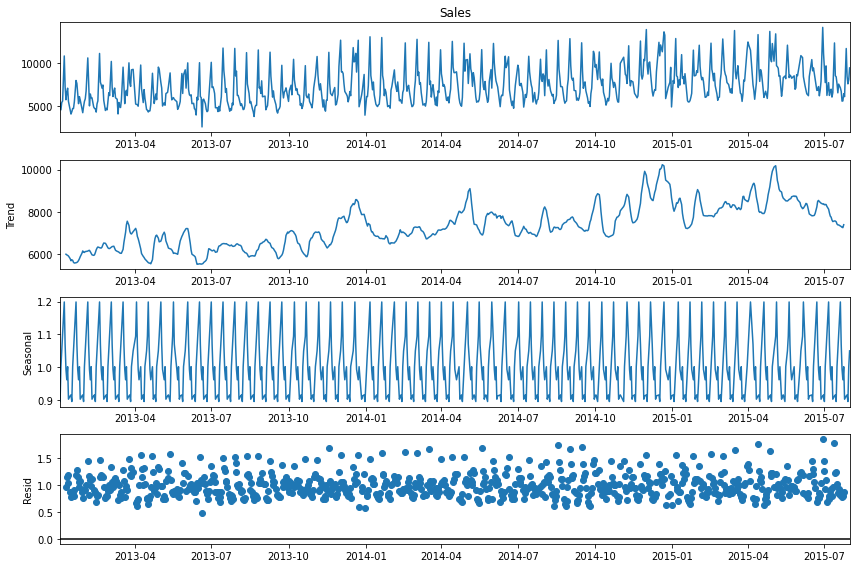

In [77]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

# Multiplicative seasonal decomposition

rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='multiplicative', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()



Sales: ADF test results:
ADF Statistic: -3.253368
p-value: 0.017096
Critical Values:
	5%: -2.865


Customers: ADF test results:
ADF Statistic: -3.915066
p-value: 0.001927
Critical Values:
	5%: -2.865


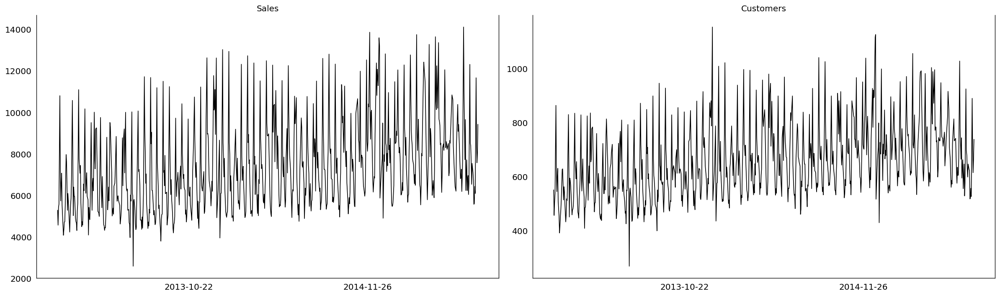

In [78]:
#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

In [79]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,771.000000,771.000000,771.000000
mean,0.430948,0.408466,0.443580
std,0.148935,0.179901,0.497129
min,0.000000,0.000000,0.000000
25%,0.324294,0.272613,0.000000
50%,0.409040,0.372821,0.000000
75%,0.512429,0.509973,1.000000
max,1.000000,1.000000,1.000000


In [87]:
model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-12']
test = model_data.loc['2015-06-12':]
print(train.shape)
print(test.shape)

(771, 4)
(730, 4)
(42, 4)


In [88]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  2
   max_eig_stat  trace_stat
0    239.375292  413.175496
1    171.910050  173.800205
2      1.890155    1.890155 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



### VARMAX MODEL 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  730
Model:                        VARMAX(1,1)   Log Likelihood                1928.083
Date:                    Wed, 30 Nov 2022   AIC                          -3830.167
Time:                            19:00:35   BIC                          -3770.457
Sample:                                 0   HQIC                         -3807.130
                                    - 730                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            2.88, 11.36   Jarque-Bera (JB):        50.50, 152.98
Prob(Q):                        0.09, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.53, 1.54   Skew:                       0.23, 0.28
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                   4.21, 5.17


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


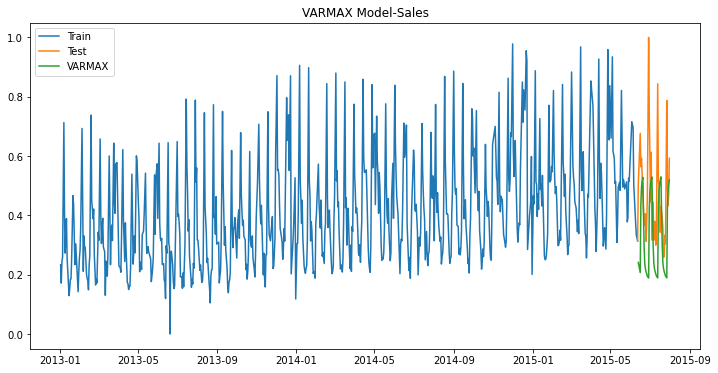

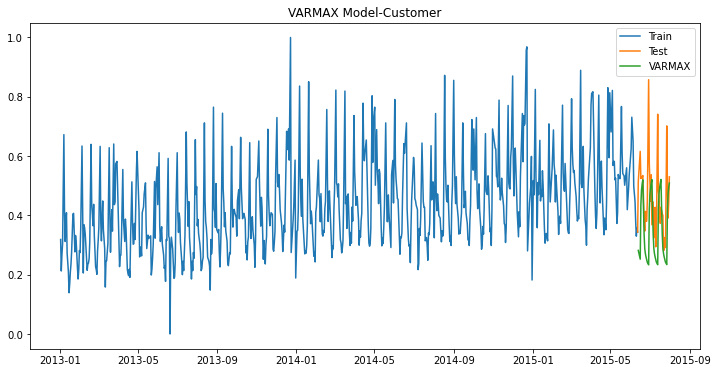

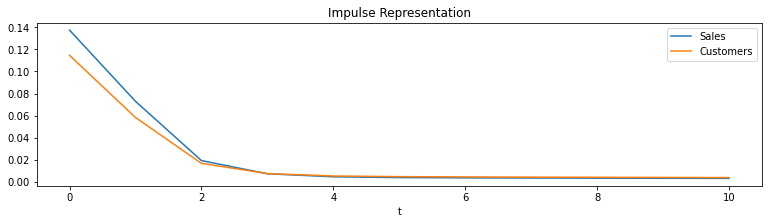

In [89]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()


## Store 31 

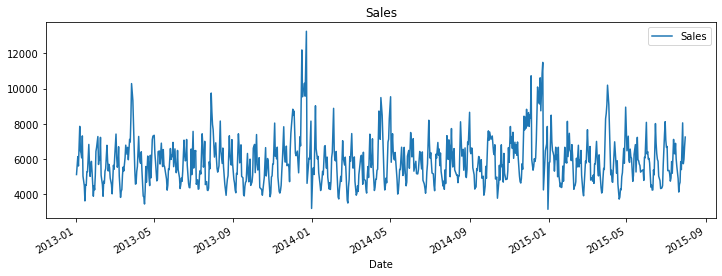

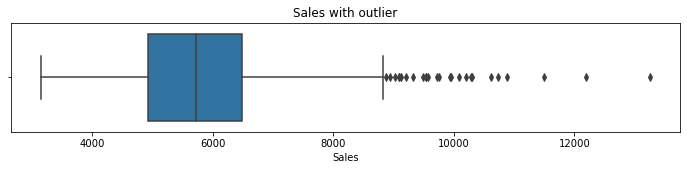

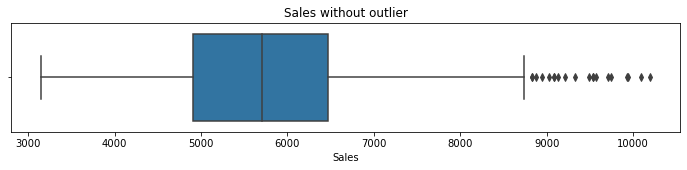

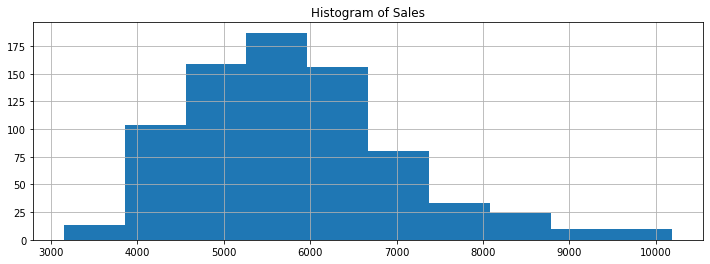

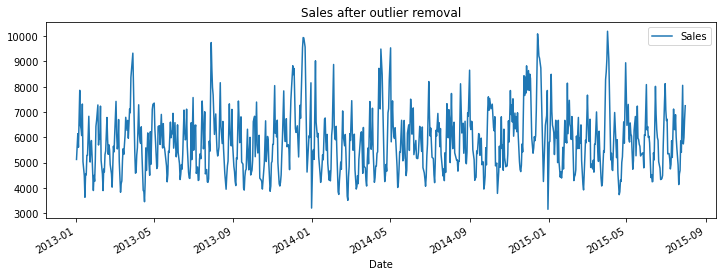

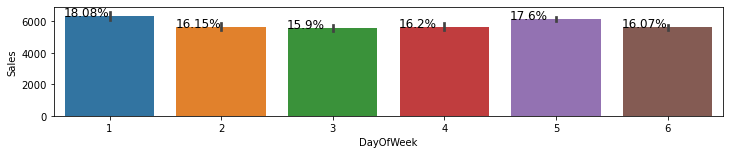

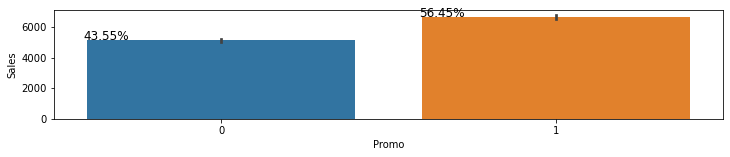

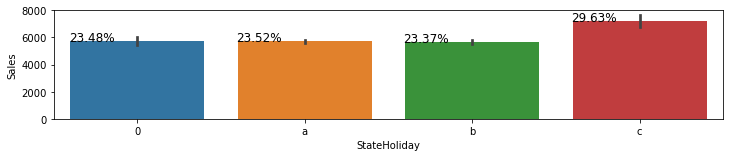

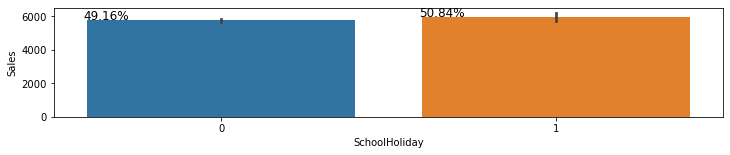

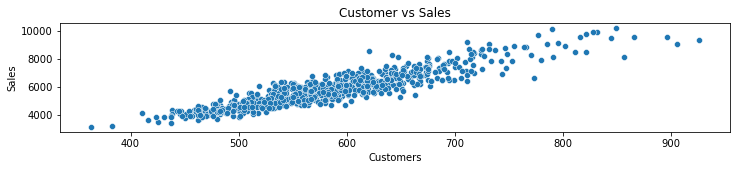

In [108]:
#Data selection
sfd1=sfd[(sfd['Store']==31)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

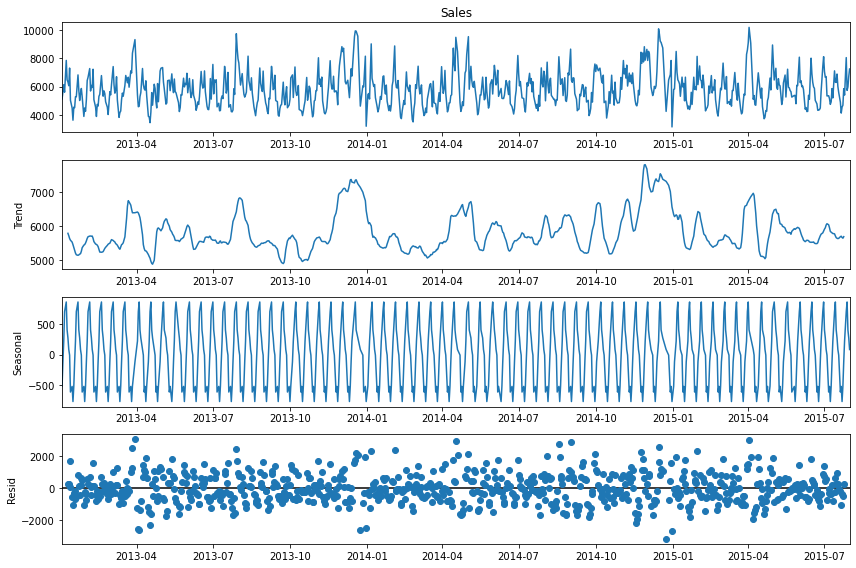

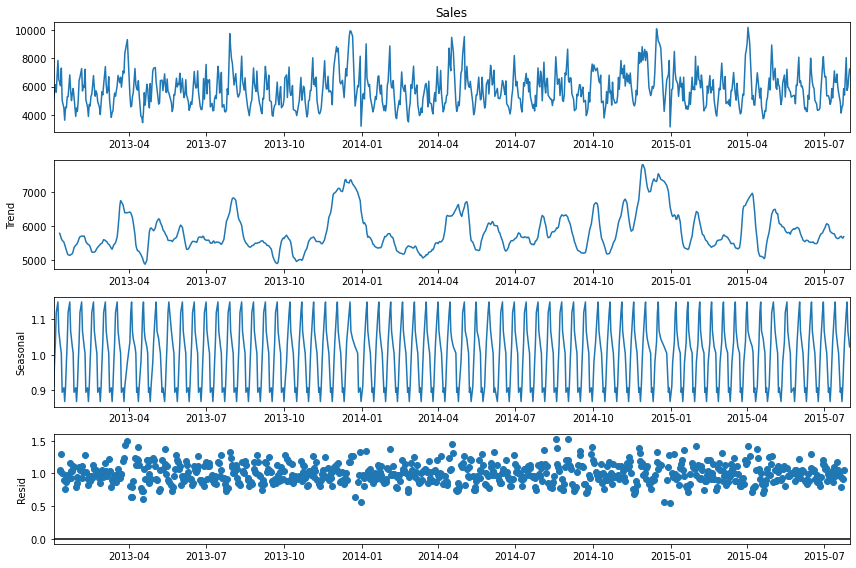

In [109]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

# Multiplicative seasonal decomposition

rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='multiplicative', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()



Sales: ADF test results:
ADF Statistic: -6.209413
p-value: 0.000000
Critical Values:
	5%: -2.865


Customers: ADF test results:
ADF Statistic: -6.555154
p-value: 0.000000
Critical Values:
	5%: -2.865


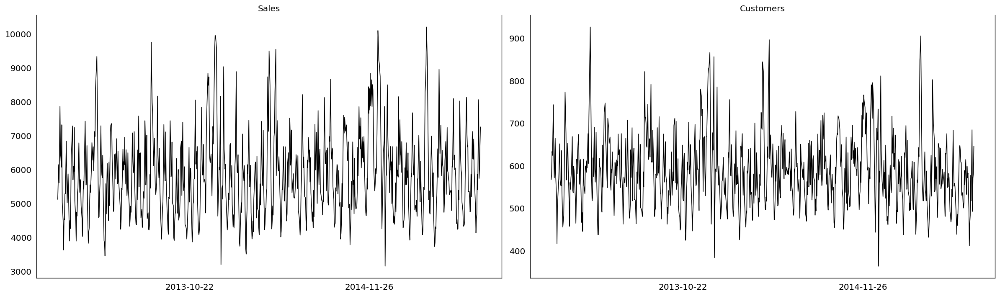

In [110]:
#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

In [111]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,776.000000,776.000000,776.000000
mean,0.389036,0.377287,0.448454
std,0.143367,0.173263,0.497657
min,0.000000,0.000000,0.000000
25%,0.293073,0.250213,0.000000
50%,0.374778,0.362062,0.000000
75%,0.465808,0.471390,1.000000
max,1.000000,1.000000,1.000000


In [112]:
model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-12']
test = model_data.loc['2015-06-13':]
print(train.shape)
print(test.shape)

(776, 4)
(734, 4)
(42, 4)


In [113]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  2
   max_eig_stat  trace_stat
0    223.827195  354.721400
1    129.246240  130.894205
2      1.647965    1.647965 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



#### VARMAX MODEL

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  734
Model:                        VARMAX(1,1)   Log Likelihood                1677.894
Date:                    Wed, 30 Nov 2022   AIC                          -3329.787
Time:                            20:28:34   BIC                          -3270.007
Sample:                                 0   HQIC                         -3306.729
                                    - 734                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):           22.51, 13.13   Jarque-Bera (JB):         74.71, 16.08
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.32, 0.99   Skew:                       0.44, 0.11
Prob(H) (two-sided):            0.03, 0.96   Kurtosis:                   4.29, 3.69


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


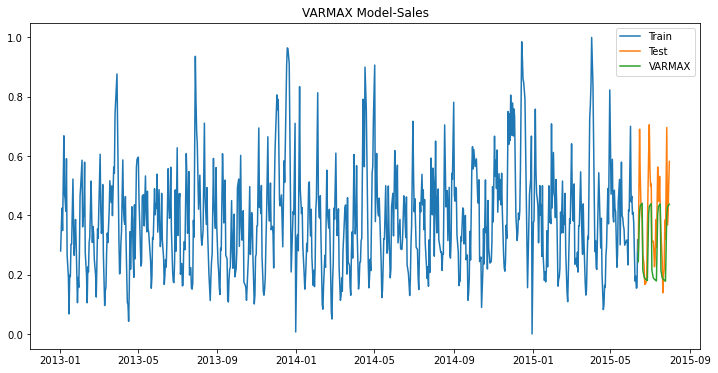

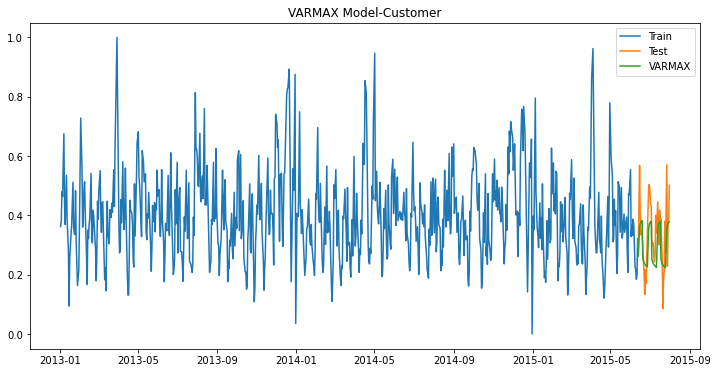

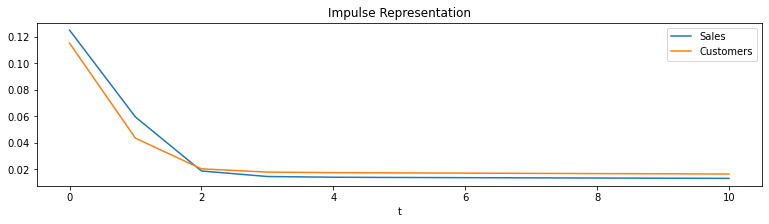

In [114]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()


In [115]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape
model_comparison.reset_index(drop=True, inplace=True)
print(model_comparison)

    Model   Variable  RMSE   MAPE
0  VARMAX      Sales  0.12  22.88
1  VARMAX  Customers  0.09  24.46


## Store 46

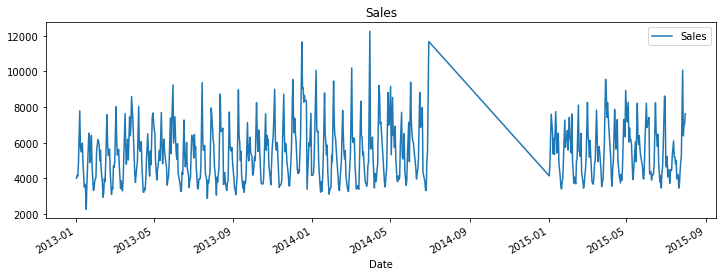

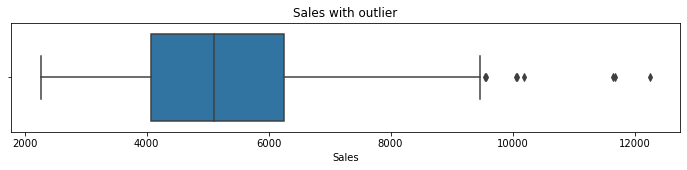

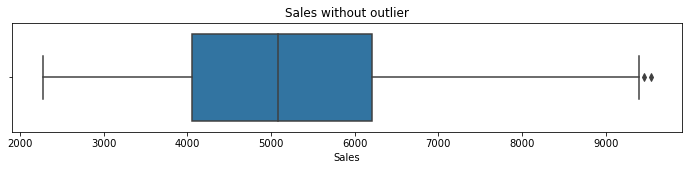

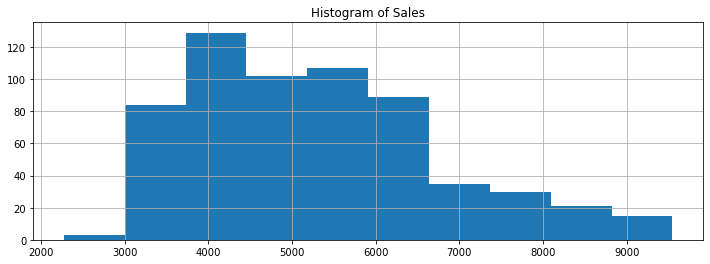

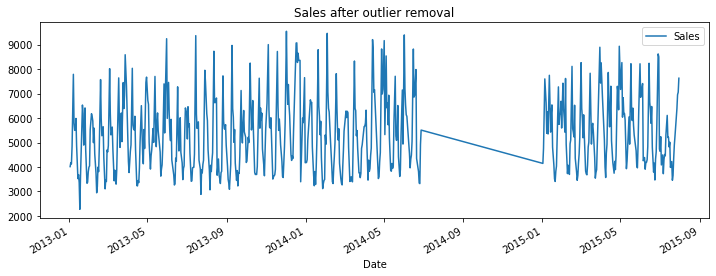

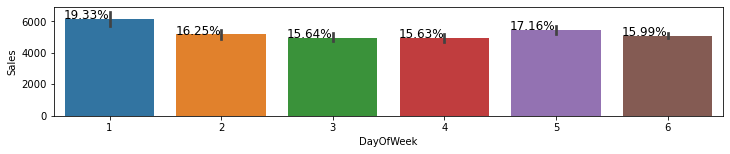

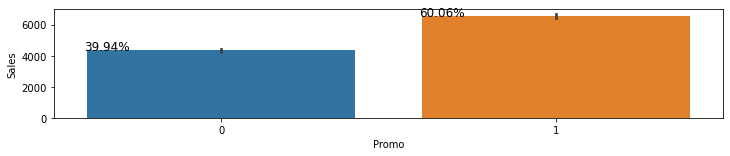

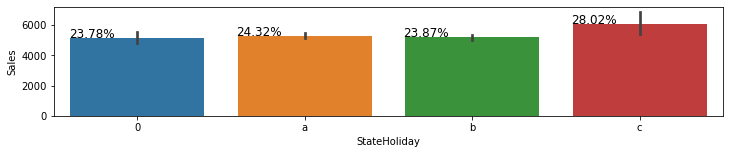

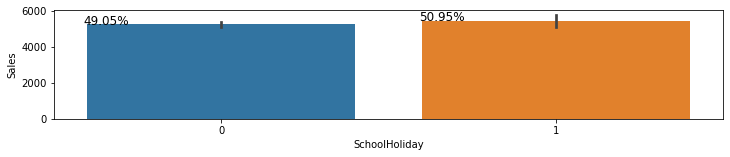

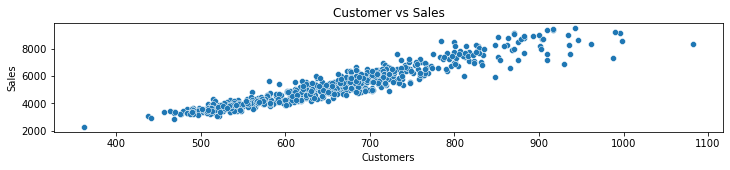

In [99]:
#Data selection
sfd1=sfd[(sfd['Store']==46)&(sfd['Open']==1)]
#Visualizing Sales data
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales')
plt.show(block=False)

# Outlier Treatment

fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales with outlier")
plt.show()
sfd1 = sfd1[(sfd1['Sales'] <= sfd1['Sales'].quantile(0.99))]
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=sfd1['Sales'])
plt.title("Sales without outlier")
plt.show()
fig = sfd1.Sales.hist(figsize = (12,4))
plt.title("Histogram of Sales")
plt.show()
sfd1[['Sales']].plot(figsize=(12, 4))
plt.legend(loc='best')
plt.title('Sales after outlier removal')
plt.show(block=False)

#Bivariate Analysis

categorical_variables = ['DayOfWeek','Promo','StateHoliday','SchoolHoliday']
for value in categorical_variables:
    fig = plt.subplots(figsize=(12, 2))
    ax = sns.barplot(x=sfd1[value], y=sfd1['Sales']) 
    totals = []
    for i in ax.patches: #for every patch in the barplot ax
        totals.append(i.get_height()) #append height for each patch
    total = sum(totals) #sum of each patch height for a plot
    for i in ax.patches:  
        ax.text(i.get_x() - .01, i.get_height() + .5, \
              str(round((i.get_height()/total)*100, 2))+'%', fontsize=12)  #text position and formula for percentage
    plt.show()
fig = plt.subplots(figsize=(12, 2))    
ax = sns.scatterplot(data=sfd1, x="Customers", y="Sales")
plt.title("Customer vs Sales")
plt.show()

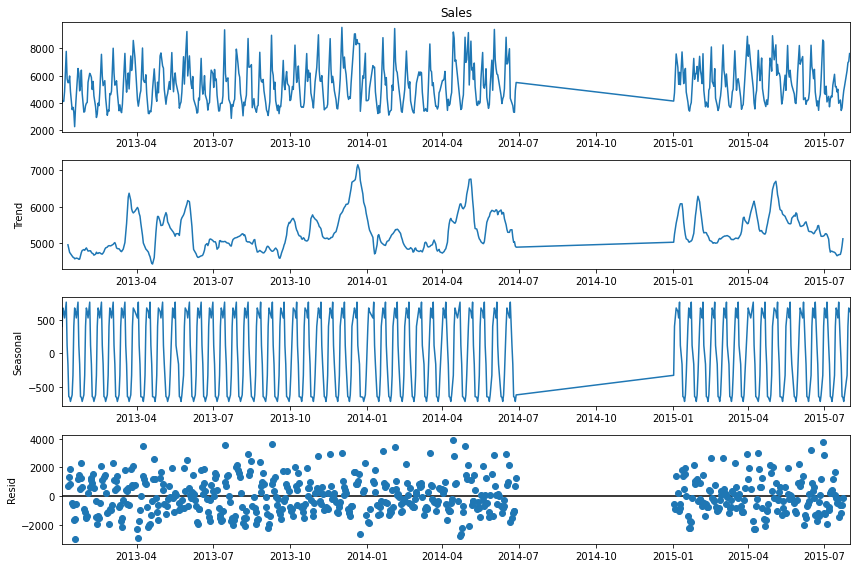

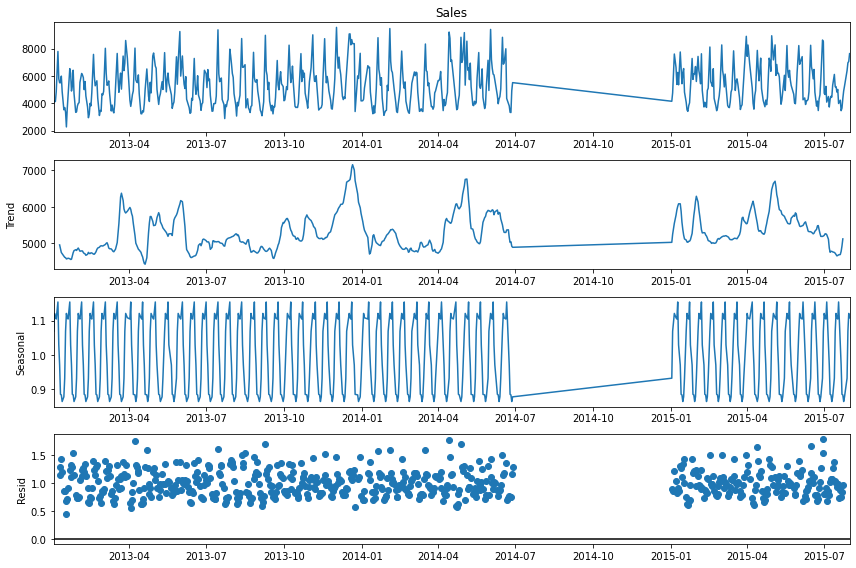

In [100]:
#Additive seasonal decomposition
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='additive', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()

# Multiplicative seasonal decomposition

rcParams['figure.figsize'] = 12, 8
sfd1.sort_index(inplace=True)
decomposition = sm.tsa.seasonal_decompose(x=sfd1.Sales, model='multiplicative', period=12) # additive seasonal index
fig = decomposition.plot()
plt.show()



Sales: ADF test results:
ADF Statistic: -5.772595
p-value: 0.000001
Critical Values:
	5%: -2.866


Customers: ADF test results:
ADF Statistic: -5.865233
p-value: 0.000000
Critical Values:
	5%: -2.866


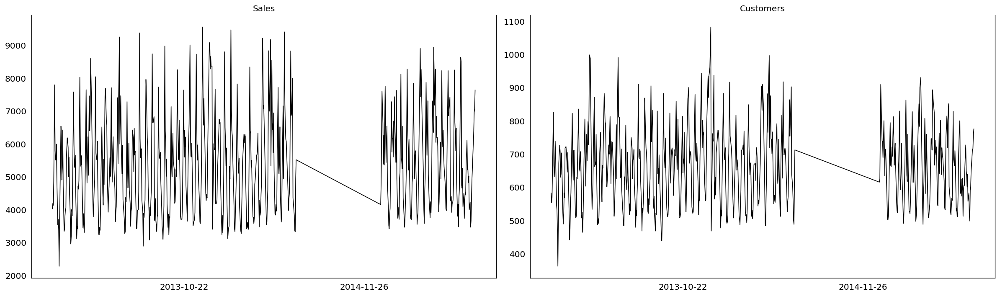

In [101]:
#### Stationarity check
#### Augmented Dickey-Fuller (ADF) test
ls=['Sales','Customers']
df=sfd1[ls]
fig, axes = plt.subplots(nrows=1, ncols=2, dpi=120, figsize=(20,6))
for i, ax in enumerate(axes.flatten()):
        ax.plot(df[df.columns[i]], color='black', linewidth=1)
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        # Decorations
        ax.set_title(df.columns[i])
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.spines["top"].set_alpha(0)
        ax.tick_params(labelsize=12)
plt.tight_layout();
#Stationarity Check
for i in range(len(ls)):
    print('\n\n' + ls[i] + ': ADF test results:')
    result = adfuller(sfd1[ls[i]].dropna())
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        if key=='5%':
            print('\t%s: %.3f' % (key, value))

In [102]:
from sklearn.preprocessing import MinMaxScaler
# Scaling the numerical data
scaler = MinMaxScaler()
model_data=pd.DataFrame()
num_vars=['Customers','Sales','Promo']
model_data[num_vars] = scaler.fit_transform(sfd1[num_vars])
# verifying the values after appying scaling.
model_data.index=sfd1.index
model_data.describe()

,Customers,Sales,Promo
count,615.000000,615.000000,615.000000
mean,0.409332,0.414918,0.434146
std,0.159164,0.202518,0.496048
min,0.000000,0.000000,0.000000
25%,0.275694,0.245017,0.000000
50%,0.406944,0.386529,0.000000
75%,0.499306,0.540825,1.000000
max,1.000000,1.000000,1.000000


In [104]:
#model_data.insert(2, 'No', range(0,len(df)))
print(model_data.shape)
train = model_data.loc['2013-01-01':'2015-06-11']
test = model_data.loc['2015-06-12':]
print(train.shape)
print(test.shape)

(615, 4)
(573, 4)
(42, 4)


In [105]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(sfd1[['Sales','Customers','Promo']],-1,1)
print("Rank : ",rank.rank)

def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    
from statsmodels.tsa.vector_ar.vecm import coint_johansen
joh_model1 = coint_johansen(sfd1[['Sales','Customers','Promo']],-1,1) # k_ar_diff +1 = K
joh_output(joh_model1)

Rank :  2
   max_eig_stat  trace_stat
0    222.392906  409.852908
1    185.788719  187.460002
2      1.671283    1.671283 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[15.7175 17.7961 22.2519]
 [ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[21.7781 24.2761 29.5147]
 [10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



### VARMAX MODEL 

C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  573
Model:                        VARMAX(1,1)   Log Likelihood                1328.451
Date:                    Wed, 30 Nov 2022   AIC                          -2630.902
Time:                            19:03:24   BIC                          -2574.341
Sample:                                 0   HQIC                         -2608.839
                                    - 573                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             4.28, 0.11   Jarque-Bera (JB):         24.06, 24.81
Prob(Q):                        0.04, 0.74   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.23, 1.41   Skew:                      0.00, -0.11
Prob(H) (two-sided):            0.16, 0.02   Kurtosis:                   4.00, 4.00


C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\SakilaPrabu\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


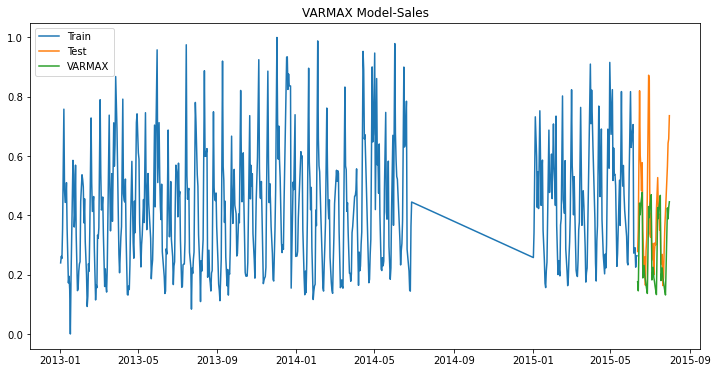

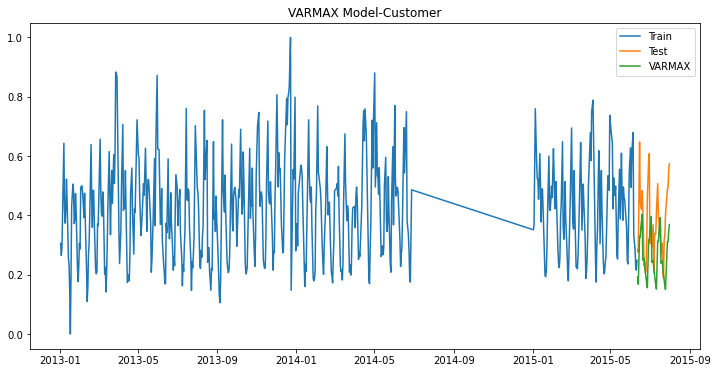

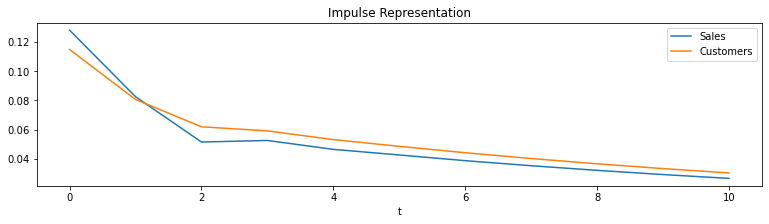

In [106]:
exog = train['Promo']
mod = sm.tsa.VARMAX(train[['Sales', 'Customers']], order=(1,1), trend='n', exog=exog)
res1 = mod.fit(maxiter=1000, disp=False)
print(res1.summary())

forcast=42
predict=res1.get_prediction(start=len(train),end=len(train)+forcast-1,exog=test['Promo'])
predictions=predict.predicted_mean

predictions['No']=predictions.index
test['Date']=test.index
prediction=pd.merge(test,predictions,on='No')
prediction.index=prediction.Date

plt.figure(figsize=(12,6)) 
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(prediction['Sales_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Sales')
plt.show()

plt.figure(figsize=(12,6))
plt.plot(train['Customers'], label='Train')
plt.plot(test['Customers'], label='Test')
plt.plot(prediction['Customers_y'], label='VARMAX')
plt.legend(loc='best')
plt.title('VARMAX Model-Customer')
plt.show()

ax = res1.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='t', title='Impulse Representation');
plt.show()


In [107]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test.Sales, prediction.Sales_y)).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VARMAX'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(test.Customers, prediction.Customers_y)).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VARMAX'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

# Mean Absolute Percentage Error
abs_error = np.abs(test.Sales-prediction.Sales_y)
actual = test.Sales
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Income: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Sales', 'MAPE'] = mape

abs_error = np.abs(test.Customers-prediction.Customers_y)
actual = test.Customers
mape = np.round(np.mean(abs_error/actual)*100, 2)
#print('Investment: MAPE:',  mape)

model_comparison.loc[model_comparison['Variable']=='Customers', 'MAPE'] = mape
model_comparison.reset_index(drop=True, inplace=True)
print(model_comparison)

    Model   Variable  RMSE   MAPE
0  VARMAX      Sales  0.18  32.84
1  VARMAX  Customers  0.15  28.26
